In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
np.set_printoptions(formatter={'float': '{: 0.3f}'.format})

In [5]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [6]:
import torch
import socket
from IPython.display import clear_output

In [7]:
import itertools
import multiprocessing as mp

In [8]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 0

In [9]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True

                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 50.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.85*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the battery level for each day
        self.v_btrack = []      #track the virtual battery level for each day

        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        self.v_btrack = np.append(self.v_btrack, self.batt) #track battery levels
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        bmean = np.mean(self.btrack)
        bdev = self.BOPT - bmean
        if np.abs(bdev) > (self.BOPT - self.ENP_MARGIN):
            reward = 1.5-np.abs(bdev)/self.BMAX*5
        else:
            reward = 1
#         reward = 2 - 20*np.abs(bdev)/self.BMAX
#         if(self.day_violation_flag):
#             violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return np.clip(reward,-1,1)#(reward - violation_penalty)
    
    
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        
#         v_batt = self.binit + self.htrack.sum() - self.atrack.sum()*self.DMAX/self.N_ACTIONS
#         self.v_btrack = np.append(self.v_btrack, v_batt) #track battery levels
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
#         if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2

        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1

        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
#             self.v_btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
RNDM_STRING = ''.join(random.choices(string.ascii_uppercase + string.digits, k=8))# + datetime.now().strftime("_%H_%M_%S")

LOCATION       = 'tokyo'
NAME           = 'DENO'+ RNDM_STRING+ '_'+datetime.now().strftime("_%H_%M_%S")+"_"
MODEL_FILENAME = './models/'+ NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", MODEL_FILENAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  ./models/DENOSTI6WR1Z__05_27_52__161.pt
SEED  :  0
HOST  :  19c994a59e65
START :  2019-07-04 05:27:52.353679


In [13]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.99           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3*10   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NN_ITERATIONS       = 240*10
GPU                 = False         # device
HELP                = 0.05
print("HYPERPARAMETERS")

HYPERPARAMETERS


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    
#     def choose_action(self, x):
#         x = torch.unsqueeze(torch.FloatTensor(x), 0)
#         x = x.to(self.device)

#         actions_value = self.eval_net.forward(x)
#         actions_value = actions_value.to(torch.device("cpu"))
#         action = torch.max(actions_value, 1)[1].data.numpy()
#         action = action[0] # return the argmax index
#         if np.random.uniform() > EPSILON:   # greedy
# #             action += np.random.randint(-3, 3)
# #             action = int(np.clip(action, 0, N_ACTIONS-1))
# #             action = np.random.randint(0,N_ACTIONS)
#             action = np.random.choice(np.arange(0, N_ACTIONS), p=[0.55, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05])

#         return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy().flatten()
        action = action[0] # return the argmax index
        
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index_limit = min(MEMORY_CAPACITY, self.memory_counter)
        sample_index = np.random.choice(sample_index_limit, BATCH_SIZE)
#         sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [15]:
c_init      = CAPM()
c_init.eno  = ENO()
c_init.HMAX = c_init.eno.SMAX

In [16]:
# CONSTANTS
BMAX = c_init.BMAX
HMAX = c_init.HMAX

In [17]:
#DISCRETIZING LIMITS 

B_MAX = c_init.BMAX
B_MIN = 0

ENP_MAX =  c_init.BMAX
ENP_MIN = -c_init.BMAX

H_MAX =  c_init.HMAX
H_MIN =  0

F_MAX = c_init.NO_OF_DAYTYPE - 1
F_MIN = 0

In [18]:
def normalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s/normalizer[None,:]        

In [19]:
def denormalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s*normalizer[None,:]    

In [20]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]

In [21]:
def batch_stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s - MU[None, :]
    return X/SD[None,:]

def batch_destdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s*SD[None, :]
    return X + MU[None,:]

In [22]:
NO_OF_NODES = 10
LOCATION = 'tokyo'
my_dqn = DQN()

In [23]:
def T_ENO(node_id, day, sc_EPSILON, param_file, capm):
    my_capm = capm
    my_capm.eno.hr = 0
    experience_record = np.empty((my_capm.eno.TIME_STEPS ,N_STATES * 2 + 2))

    my_dqn.eval_net.load_state_dict(torch.load(param_file))
    my_dqn.eval_net.eval()
    np.random.seed(node_id+day)

    my_EPSILON = sc_EPSILON
#     PREF = 1-my_EPSILON

    s = my_capm.getstate()
    

#     my_prob = [(1-PREF)/NO_OF_NODES]*NO_OF_NODES
#     my_prob[int((node_id)%N_ACTIONS)] += PREF
    while True:
        
        if np.random.uniform() > my_EPSILON:
            a = np.random.randint(0,N_ACTIONS)
#             a = np.random.choice(np.arange(0, N_ACTIONS), p=my_prob)
        else:
            a = my_dqn.choose_greedy_action(stdize(s))

        
        # take action
        s_, r, day_end, year_end = my_capm.step(a)

        # store experience   
        experience_record[int(my_capm.eno.hr-1)] = np.hstack((stdize(s), [a, r], stdize(s_)))

        s = s_
        
        if day_end:
            experience_record[:,N_STATES + 1]  = r
            break
            

    
    
    return [experience_record, my_capm]

In [24]:
dqn = DQN()
torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
dqn.eval_net.eval()
pool = mp.Pool(processes=NO_OF_NODES)

0
0.1
2000
1562218073.778256
LOSS : 0.305
LOSS : 0.064
LOSS : 0.050
LOSS : 0.048
LOSS : 0.052
LOSS : 0.060
LOSS : 0.072
LOSS : 0.091
LOSS : 0.121
LOSS : 0.157
LOSS : 0.208
LOSS : 0.283
LOSS : 0.361
LOSS : 0.476
LOSS : 0.638
LOSS : 0.881
LOSS : 1.159
LOSS : 1.374
LOSS : 1.792
LOSS : 2.062
LOSS : 2.481
LOSS : 2.868
LOSS : 3.454
LOSS : 4.248
LOSS : 5.050
LOSS : 6.268
LOSS : 7.090
LOSS : 7.525
LOSS : 7.910
LOSS : 8.742
LOSS : 9.814
LOSS : 10.599
LOSS : 11.223
LOSS : 11.721
LOSS : 12.273
LOSS : 11.874
LOSS : 12.169
LOSS : 12.014
LOSS : 11.816
LOSS : 11.662
LOSS : 11.638
LOSS : 11.278
LOSS : 11.061
LOSS : 11.147
LOSS : 11.472
LOSS : 11.631
LOSS : 11.610
LOSS : 11.615
LOSS : 11.708
LOSS : 12.013
LOSS : 12.617
LOSS : 12.740
LOSS : 13.155
LOSS : 13.355
LOSS : 13.636
LOSS : 13.888
LOSS : 14.617
LOSS : 14.814
LOSS : 14.918
LOSS : 15.361
LOSS : 15.544
LOSS : 15.500
LOSS : 15.957
LOSS : 16.014
LOSS : 15.919
LOSS : 15.904
LOSS : 16.216
LOSS : 16.225
LOSS : 16.240
LOSS : 16.213
LOSS : 16.406
LOSS : 1

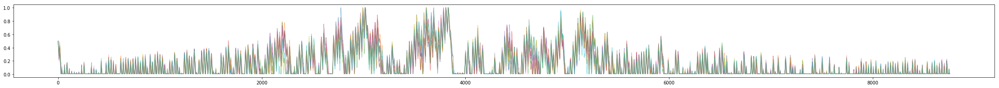

1
0.2
2000
1562218744.1547823
LOSS : 16.236
LOSS : 16.423
LOSS : 16.276
LOSS : 16.165
LOSS : 16.192
LOSS : 15.902
LOSS : 15.717
LOSS : 16.069
LOSS : 15.378
LOSS : 15.950
LOSS : 15.868
LOSS : 15.929
LOSS : 16.504
LOSS : 16.404
LOSS : 16.484
LOSS : 16.797
LOSS : 17.665
LOSS : 17.978
LOSS : 18.200
LOSS : 18.321
LOSS : 19.184
LOSS : 19.789
LOSS : 20.333
LOSS : 21.279
LOSS : 21.325
LOSS : 21.615
LOSS : 21.654
LOSS : 21.322
LOSS : 21.677
LOSS : 21.911
LOSS : 22.123
LOSS : 21.803
LOSS : 22.260
LOSS : 22.202
LOSS : 22.959
LOSS : 22.804
LOSS : 22.646
LOSS : 22.903
LOSS : 23.933
LOSS : 23.538
LOSS : 24.287
LOSS : 24.237
LOSS : 24.643
LOSS : 24.646
LOSS : 24.629
LOSS : 25.230
LOSS : 25.893
LOSS : 26.101
LOSS : 25.750
LOSS : 26.569
LOSS : 25.737
LOSS : 26.161
LOSS : 25.857
LOSS : 26.457
LOSS : 26.786
LOSS : 26.796
LOSS : 26.582
LOSS : 26.484
LOSS : 26.975
LOSS : 27.146
LOSS : 27.405
LOSS : 27.166
LOSS : 27.251
LOSS : 26.277
LOSS : 26.608
LOSS : 26.490
LOSS : 26.548
LOSS : 26.662
LOSS : 26.151
LOSS

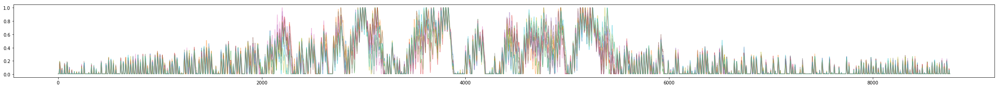

2
0.30000000000000004
2000
1562219412.8274472
LOSS : 26.642
LOSS : 26.617
LOSS : 26.139
LOSS : 27.101
LOSS : 27.277
LOSS : 27.688
LOSS : 27.806
LOSS : 27.572
LOSS : 27.906
LOSS : 27.936
LOSS : 28.644
LOSS : 28.745
LOSS : 28.337
LOSS : 28.578
LOSS : 28.906
LOSS : 28.780
LOSS : 30.121
LOSS : 29.505
LOSS : 30.395
LOSS : 31.280
LOSS : 30.408
LOSS : 30.936
LOSS : 31.602
LOSS : 31.988
LOSS : 32.093
LOSS : 31.865
LOSS : 31.041
LOSS : 31.105
LOSS : 32.347
LOSS : 31.644
LOSS : 32.746
LOSS : 33.377
LOSS : 33.654
LOSS : 32.544
LOSS : 32.524
LOSS : 34.004
LOSS : 34.497
LOSS : 34.357
LOSS : 33.701
LOSS : 34.525
LOSS : 33.780
LOSS : 33.638
LOSS : 33.656
LOSS : 34.285
LOSS : 33.627
LOSS : 33.726
LOSS : 35.238
LOSS : 34.710
LOSS : 34.772
LOSS : 34.376
LOSS : 34.716
LOSS : 33.662
LOSS : 34.292
LOSS : 34.230
LOSS : 34.845
LOSS : 35.118
LOSS : 36.220
LOSS : 35.076
LOSS : 35.472
LOSS : 35.436
LOSS : 36.047
LOSS : 36.283
LOSS : 35.871
LOSS : 35.562
LOSS : 36.354
LOSS : 36.522
LOSS : 35.796
LOSS : 35.797
LO

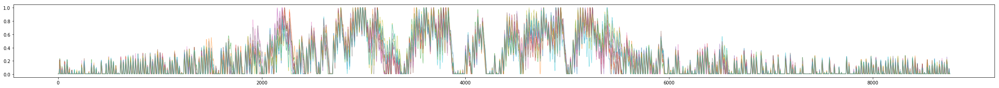

3
0.4
2000
1562220080.416102
LOSS : 34.962
LOSS : 33.624
LOSS : 34.817
LOSS : 33.606
LOSS : 33.859
LOSS : 33.549
LOSS : 33.764
LOSS : 33.032
LOSS : 32.352
LOSS : 32.815
LOSS : 31.343
LOSS : 32.785
LOSS : 32.166
LOSS : 32.021
LOSS : 32.606
LOSS : 33.165
LOSS : 31.790
LOSS : 31.692
LOSS : 32.430
LOSS : 32.089
LOSS : 33.201
LOSS : 33.004
LOSS : 33.168
LOSS : 32.409
LOSS : 32.882
LOSS : 33.272
LOSS : 32.649
LOSS : 33.001
LOSS : 33.526
LOSS : 31.860
LOSS : 31.965
LOSS : 33.360
LOSS : 32.872
LOSS : 33.501
LOSS : 34.203
LOSS : 33.676
LOSS : 34.855
LOSS : 34.140
LOSS : 34.608
LOSS : 34.032
LOSS : 34.521
LOSS : 34.859
LOSS : 34.806
LOSS : 34.477
LOSS : 34.308
LOSS : 34.768
LOSS : 34.915
LOSS : 34.288
LOSS : 35.185
LOSS : 34.834
LOSS : 34.891
LOSS : 35.160
LOSS : 37.114
LOSS : 36.243
LOSS : 36.614
LOSS : 36.949
LOSS : 37.165
LOSS : 37.772
LOSS : 37.864
LOSS : 37.169
LOSS : 37.119
LOSS : 35.980
LOSS : 36.000
LOSS : 36.735
LOSS : 37.586
LOSS : 36.618
LOSS : 36.854
LOSS : 35.447
LOSS : 36.463
LOSS 

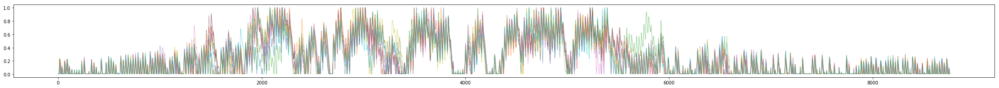

4
0.5
2000
1562220749.9126801
LOSS : 35.124
LOSS : 33.589
LOSS : 32.843
LOSS : 32.514
LOSS : 33.308
LOSS : 32.013
LOSS : 31.967
LOSS : 31.236
LOSS : 32.576
LOSS : 30.953
LOSS : 31.766
LOSS : 31.780
LOSS : 31.991
LOSS : 32.588
LOSS : 32.606
LOSS : 32.738
LOSS : 31.950
LOSS : 31.916
LOSS : 31.211
LOSS : 30.843
LOSS : 32.349
LOSS : 30.429
LOSS : 31.244
LOSS : 31.537
LOSS : 31.623
LOSS : 31.433
LOSS : 29.290
LOSS : 30.222
LOSS : 30.879
LOSS : 29.806
LOSS : 30.490
LOSS : 29.141
LOSS : 29.437
LOSS : 29.654
LOSS : 29.814
LOSS : 29.394
LOSS : 30.033
LOSS : 30.792
LOSS : 29.067
LOSS : 29.573
LOSS : 29.468
LOSS : 28.820
LOSS : 29.944
LOSS : 30.318
LOSS : 29.062
LOSS : 28.698
LOSS : 29.322
LOSS : 28.634
LOSS : 28.584
LOSS : 28.474
LOSS : 29.577
LOSS : 28.714
LOSS : 29.334
LOSS : 29.544
LOSS : 30.229
LOSS : 28.377
LOSS : 28.614
LOSS : 28.830
LOSS : 29.102
LOSS : 30.083
LOSS : 30.817
LOSS : 30.341
LOSS : 29.656
LOSS : 30.555
LOSS : 29.833
LOSS : 30.684
LOSS : 29.871
LOSS : 30.561
LOSS : 30.565
LOSS

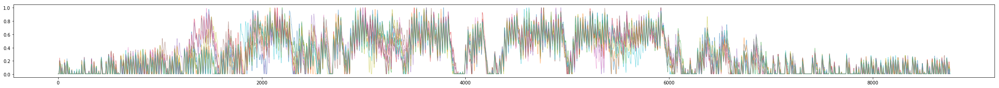

5
0.6
2000
1562221419.9773123
LOSS : 27.412
LOSS : 28.154
LOSS : 27.501
LOSS : 27.742
LOSS : 26.215
LOSS : 26.889
LOSS : 25.611
LOSS : 26.867
LOSS : 26.240
LOSS : 25.935
LOSS : 26.502
LOSS : 25.722
LOSS : 25.927
LOSS : 26.317
LOSS : 25.697
LOSS : 25.467
LOSS : 25.009
LOSS : 24.478
LOSS : 24.064
LOSS : 23.551
LOSS : 22.763
LOSS : 24.044
LOSS : 23.509
LOSS : 23.241
LOSS : 22.326
LOSS : 23.200
LOSS : 23.440
LOSS : 24.348
LOSS : 23.104
LOSS : 22.253
LOSS : 22.741
LOSS : 22.440
LOSS : 22.424
LOSS : 22.079
LOSS : 22.727
LOSS : 22.846
LOSS : 23.391
LOSS : 22.130
LOSS : 21.830
LOSS : 21.911
LOSS : 22.190
LOSS : 22.861
LOSS : 21.900
LOSS : 21.987
LOSS : 21.612
LOSS : 21.544
LOSS : 21.531
LOSS : 22.318
LOSS : 22.066
LOSS : 22.676
LOSS : 22.119
LOSS : 22.251
LOSS : 22.403
LOSS : 23.066
LOSS : 23.359
LOSS : 22.551
LOSS : 23.298
LOSS : 23.496
LOSS : 23.608
LOSS : 23.846
LOSS : 23.911
LOSS : 23.337
LOSS : 23.255
LOSS : 23.679
LOSS : 22.986
LOSS : 22.828
LOSS : 23.101
LOSS : 22.677
LOSS : 22.572
LOSS

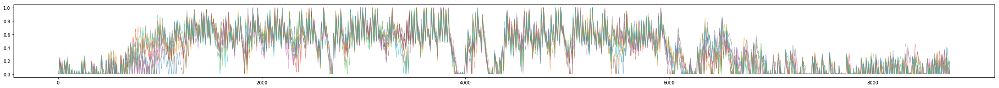

6
0.7000000000000001
2000
1562222090.3700662
LOSS : 22.522
LOSS : 21.936
LOSS : 22.211
LOSS : 21.749
LOSS : 21.436
LOSS : 20.599
LOSS : 20.883
LOSS : 21.340
LOSS : 20.823
LOSS : 20.500
LOSS : 21.343
LOSS : 20.770
LOSS : 20.546
LOSS : 21.667
LOSS : 20.697
LOSS : 20.417
LOSS : 20.303
LOSS : 19.856
LOSS : 19.963
LOSS : 19.466
LOSS : 19.520
LOSS : 19.088
LOSS : 20.776
LOSS : 20.385
LOSS : 20.298
LOSS : 21.211
LOSS : 19.517
LOSS : 20.228
LOSS : 20.767
LOSS : 20.193
LOSS : 20.211
LOSS : 19.399
LOSS : 18.982
LOSS : 18.753
LOSS : 19.116
LOSS : 19.341
LOSS : 18.941
LOSS : 19.231
LOSS : 19.105
LOSS : 18.589
LOSS : 18.036
LOSS : 18.861
LOSS : 18.302
LOSS : 18.447
LOSS : 18.557
LOSS : 17.617
LOSS : 18.454
LOSS : 18.042
LOSS : 17.629
LOSS : 17.996
LOSS : 17.603
LOSS : 17.461
LOSS : 18.926
LOSS : 18.517
LOSS : 18.212
LOSS : 18.247
LOSS : 18.741
LOSS : 17.590
LOSS : 18.297
LOSS : 18.479
LOSS : 18.985
LOSS : 19.121
LOSS : 18.414
LOSS : 19.260
LOSS : 18.470
LOSS : 18.707
LOSS : 18.320
LOSS : 18.055
LOS

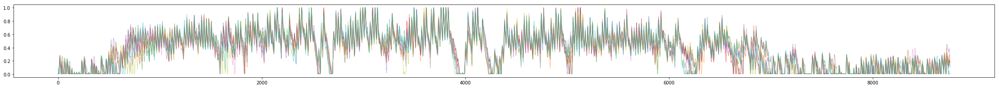

7
0.8
2000
1562222762.071
LOSS : 17.123
LOSS : 17.946
LOSS : 17.884
LOSS : 18.005
LOSS : 17.589
LOSS : 17.441
LOSS : 16.913
LOSS : 17.097
LOSS : 17.317
LOSS : 16.274
LOSS : 17.769
LOSS : 17.136
LOSS : 16.623
LOSS : 16.758
LOSS : 16.906
LOSS : 17.060
LOSS : 16.401
LOSS : 16.469
LOSS : 16.403
LOSS : 16.496
LOSS : 16.079
LOSS : 16.228
LOSS : 16.788
LOSS : 17.206
LOSS : 16.927
LOSS : 16.702
LOSS : 16.566
LOSS : 16.692
LOSS : 16.737
LOSS : 17.123
LOSS : 16.830
LOSS : 16.853
LOSS : 17.549
LOSS : 17.112
LOSS : 17.069
LOSS : 16.472
LOSS : 16.474
LOSS : 15.852
LOSS : 16.597
LOSS : 15.675
LOSS : 16.307
LOSS : 15.847
LOSS : 15.176
LOSS : 15.168
LOSS : 15.327
LOSS : 14.918
LOSS : 15.159
LOSS : 14.536
LOSS : 14.940
LOSS : 14.577
LOSS : 14.624
LOSS : 14.751
LOSS : 14.933
LOSS : 15.416
LOSS : 15.334
LOSS : 15.385
LOSS : 15.298
LOSS : 15.452
LOSS : 15.964
LOSS : 15.130
LOSS : 15.924
LOSS : 16.387
LOSS : 15.493
LOSS : 15.780
LOSS : 15.502
LOSS : 15.546
LOSS : 15.665
LOSS : 15.796
LOSS : 16.002
LOSS : 1

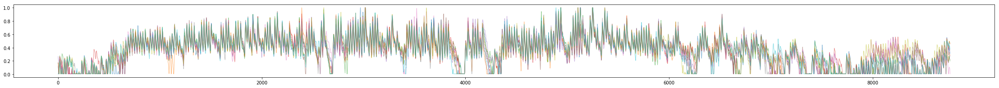

8
0.9
2000
1562223428.5478222
LOSS : 16.066
LOSS : 16.722
LOSS : 17.377
LOSS : 16.569
LOSS : 16.871
LOSS : 17.084
LOSS : 16.909
LOSS : 16.565
LOSS : 16.683
LOSS : 16.760
LOSS : 16.639
LOSS : 16.374
LOSS : 16.471
LOSS : 16.234
LOSS : 16.550
LOSS : 16.457
LOSS : 16.120
LOSS : 16.013
LOSS : 16.361
LOSS : 15.837
LOSS : 16.123
LOSS : 15.550
LOSS : 15.757
LOSS : 15.789
LOSS : 15.988
LOSS : 15.834
LOSS : 15.264
LOSS : 15.783
LOSS : 15.507
LOSS : 15.651
LOSS : 15.713
LOSS : 15.871
LOSS : 15.227
LOSS : 14.815
LOSS : 15.337
LOSS : 14.887
LOSS : 15.154
LOSS : 14.902
LOSS : 14.303
LOSS : 14.380
LOSS : 14.168
LOSS : 14.038
LOSS : 14.099
LOSS : 14.103
LOSS : 13.988
LOSS : 13.951
LOSS : 13.955
LOSS : 14.165
LOSS : 13.916
LOSS : 13.537
LOSS : 13.610
LOSS : 14.118
LOSS : 13.912
LOSS : 13.796
LOSS : 13.778
LOSS : 13.868
LOSS : 14.298
LOSS : 13.751
LOSS : 13.766
LOSS : 14.407
LOSS : 13.683
LOSS : 13.582
LOSS : 13.048
LOSS : 13.490
LOSS : 13.536
LOSS : 13.387
LOSS : 14.438
LOSS : 14.038
LOSS : 13.739
LOSS

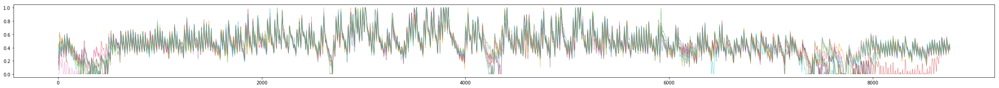

9
0.99
2000
1562224096.8523839
LOSS : 13.442
LOSS : 13.632
LOSS : 13.860
LOSS : 13.748
LOSS : 14.030
LOSS : 13.249
LOSS : 12.641
LOSS : 13.237
LOSS : 12.943
LOSS : 12.700
LOSS : 12.887
LOSS : 12.821
LOSS : 12.922
LOSS : 12.374
LOSS : 12.854
LOSS : 12.343
LOSS : 11.711
LOSS : 12.111
LOSS : 11.937
LOSS : 11.477
LOSS : 11.549
LOSS : 12.007
LOSS : 12.170
LOSS : 11.457
LOSS : 11.996
LOSS : 11.452
LOSS : 11.898
LOSS : 11.817
LOSS : 11.299
LOSS : 11.749
LOSS : 11.952
LOSS : 11.874
LOSS : 11.629
LOSS : 11.437
LOSS : 11.539
LOSS : 11.228
LOSS : 11.397
LOSS : 10.940
LOSS : 10.838
LOSS : 10.414
LOSS : 10.548
LOSS : 10.841
LOSS : 10.184
LOSS : 10.009
LOSS : 10.132
LOSS : 10.206
LOSS : 9.603
LOSS : 9.823
LOSS : 9.627
LOSS : 9.699
LOSS : 9.604
LOSS : 9.533
LOSS : 9.435
LOSS : 9.382
LOSS : 9.408
LOSS : 9.278
LOSS : 8.945
LOSS : 8.894
LOSS : 8.742
LOSS : 8.854
LOSS : 8.843
LOSS : 9.074
LOSS : 8.755
LOSS : 9.119
LOSS : 8.806
LOSS : 9.176
LOSS : 9.100
LOSS : 8.931
LOSS : 9.412
LOSS : 9.245
LOSS : 9.081


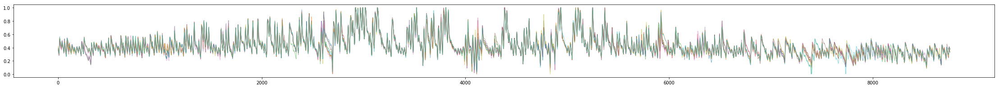

10
0.99
2000
1562224769.6602767
LOSS : 9.369
LOSS : 9.532
LOSS : 9.833
LOSS : 9.881
LOSS : 9.974
LOSS : 9.411
LOSS : 9.155
LOSS : 9.160
LOSS : 8.752
LOSS : 8.909
LOSS : 8.796
LOSS : 8.845
LOSS : 8.886
LOSS : 8.887
LOSS : 8.765
LOSS : 8.634
LOSS : 8.136
LOSS : 8.260
LOSS : 8.196
LOSS : 7.856
LOSS : 8.064
LOSS : 7.948
LOSS : 7.932
LOSS : 7.757
LOSS : 8.038
LOSS : 7.979
LOSS : 7.924
LOSS : 7.588
LOSS : 7.775
LOSS : 7.726
LOSS : 7.576
LOSS : 7.282
LOSS : 7.555
LOSS : 7.306
LOSS : 7.196
LOSS : 6.932
LOSS : 6.744
LOSS : 6.712
LOSS : 6.559
LOSS : 6.400
LOSS : 6.501
LOSS : 6.171
LOSS : 6.001
LOSS : 5.972
LOSS : 5.778
LOSS : 5.761
LOSS : 5.643
LOSS : 5.474
LOSS : 5.364
LOSS : 5.479
LOSS : 5.267
LOSS : 5.063
LOSS : 5.119
LOSS : 4.958
LOSS : 4.853
LOSS : 4.753
LOSS : 4.732
LOSS : 4.625
LOSS : 4.606
LOSS : 4.405
LOSS : 4.317
LOSS : 4.359
LOSS : 4.466
LOSS : 4.436
LOSS : 4.461
LOSS : 4.412
LOSS : 4.451
LOSS : 4.437
LOSS : 4.565
LOSS : 4.534
LOSS : 4.622
LOSS : 4.440


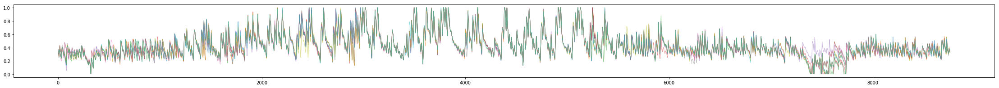

11
0.99
2000
1562225442.5126295
LOSS : 4.464
LOSS : 4.607
LOSS : 4.445
LOSS : 4.355
LOSS : 4.416
LOSS : 4.406
LOSS : 4.331
LOSS : 4.285
LOSS : 4.245
LOSS : 4.211
LOSS : 4.220
LOSS : 4.054
LOSS : 4.140
LOSS : 3.960
LOSS : 3.897
LOSS : 3.799
LOSS : 3.857
LOSS : 3.790
LOSS : 3.871
LOSS : 3.753
LOSS : 3.740
LOSS : 3.786
LOSS : 3.804
LOSS : 3.685
LOSS : 3.722
LOSS : 3.773
LOSS : 3.690
LOSS : 3.690
LOSS : 3.661
LOSS : 3.680
LOSS : 3.704
LOSS : 3.683
LOSS : 3.656
LOSS : 3.591
LOSS : 3.695
LOSS : 3.702
LOSS : 3.866
LOSS : 3.751
LOSS : 3.706
LOSS : 3.577
LOSS : 3.594
LOSS : 3.576
LOSS : 3.573
LOSS : 3.720
LOSS : 3.644
LOSS : 3.526
LOSS : 3.344
LOSS : 3.369
LOSS : 3.255
LOSS : 3.260
LOSS : 3.285
LOSS : 3.232
LOSS : 3.209
LOSS : 3.106
LOSS : 3.106
LOSS : 3.210
LOSS : 3.113
LOSS : 3.162
LOSS : 3.156
LOSS : 3.028
LOSS : 3.051
LOSS : 3.065
LOSS : 3.094
LOSS : 3.049
LOSS : 3.115
LOSS : 3.215
LOSS : 3.313
LOSS : 3.344
LOSS : 3.427
LOSS : 3.377
LOSS : 3.405
LOSS : 3.419
LOSS : 3.439


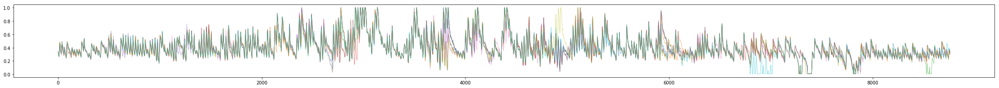

12
0.99
2000
1562226116.1492329
LOSS : 3.520
LOSS : 3.460
LOSS : 3.532
LOSS : 3.642
LOSS : 3.645
LOSS : 3.664
LOSS : 3.535
LOSS : 3.535
LOSS : 3.392
LOSS : 3.444
LOSS : 3.420
LOSS : 3.342
LOSS : 3.313
LOSS : 3.436
LOSS : 3.380
LOSS : 3.410
LOSS : 3.516
LOSS : 3.363
LOSS : 3.353
LOSS : 3.403
LOSS : 3.334
LOSS : 3.368
LOSS : 3.530
LOSS : 3.414
LOSS : 3.533
LOSS : 3.310
LOSS : 3.396
LOSS : 3.417
LOSS : 3.367
LOSS : 3.361
LOSS : 3.456
LOSS : 3.504
LOSS : 3.429
LOSS : 3.451
LOSS : 3.399
LOSS : 3.458
LOSS : 3.414
LOSS : 3.443
LOSS : 3.439
LOSS : 3.493
LOSS : 3.409
LOSS : 3.323
LOSS : 3.409
LOSS : 3.348
LOSS : 3.252
LOSS : 3.218
LOSS : 3.176
LOSS : 3.251
LOSS : 3.214
LOSS : 3.175
LOSS : 3.269
LOSS : 3.256
LOSS : 3.310
LOSS : 3.169
LOSS : 3.213
LOSS : 3.290
LOSS : 3.280
LOSS : 3.318
LOSS : 3.197
LOSS : 3.332
LOSS : 3.329
LOSS : 3.364
LOSS : 3.306
LOSS : 3.499
LOSS : 3.481
LOSS : 3.514
LOSS : 3.435
LOSS : 3.413
LOSS : 3.381
LOSS : 3.455
LOSS : 3.510
LOSS : 3.438


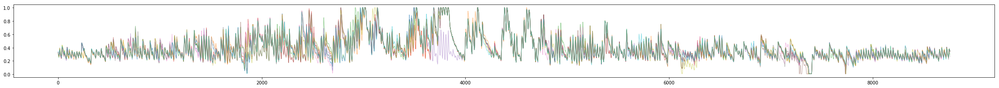

13
0.99
2000
1562226786.3505912
LOSS : 3.465
LOSS : 3.407
LOSS : 3.370
LOSS : 3.441
LOSS : 3.443
LOSS : 3.526
LOSS : 3.501
LOSS : 3.521
LOSS : 3.510
LOSS : 3.551
LOSS : 3.624
LOSS : 3.446
LOSS : 3.636
LOSS : 3.655
LOSS : 3.667
LOSS : 3.587
LOSS : 3.634
LOSS : 3.626
LOSS : 3.605
LOSS : 3.659
LOSS : 3.594
LOSS : 3.721
LOSS : 3.659
LOSS : 3.790
LOSS : 3.782
LOSS : 3.780
LOSS : 3.788
LOSS : 3.749
LOSS : 3.755
LOSS : 3.675
LOSS : 3.643
LOSS : 3.805
LOSS : 3.692
LOSS : 3.689
LOSS : 3.821
LOSS : 3.709
LOSS : 3.696
LOSS : 3.724
LOSS : 3.906
LOSS : 3.744
LOSS : 3.797
LOSS : 3.728
LOSS : 3.805
LOSS : 3.835
LOSS : 3.691
LOSS : 3.726
LOSS : 3.560
LOSS : 3.524
LOSS : 3.512
LOSS : 3.502
LOSS : 3.427
LOSS : 3.500
LOSS : 3.454
LOSS : 3.511
LOSS : 3.448
LOSS : 3.543
LOSS : 3.597
LOSS : 3.510
LOSS : 3.643
LOSS : 3.612
LOSS : 3.561
LOSS : 3.477
LOSS : 3.517
LOSS : 3.508
LOSS : 3.400
LOSS : 3.523
LOSS : 3.402
LOSS : 3.448
LOSS : 3.433
LOSS : 3.508
LOSS : 3.455
LOSS : 3.565


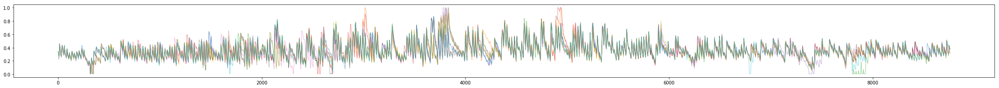

14
0.99
2000
1562227458.663457
LOSS : 3.560
LOSS : 3.628
LOSS : 3.563
LOSS : 3.787
LOSS : 3.806
LOSS : 3.791
LOSS : 3.696
LOSS : 3.710
LOSS : 3.704
LOSS : 3.787
LOSS : 3.722
LOSS : 3.621
LOSS : 3.752
LOSS : 3.513
LOSS : 3.592
LOSS : 3.432
LOSS : 3.538
LOSS : 3.426
LOSS : 3.243
LOSS : 3.348
LOSS : 3.274
LOSS : 3.174
LOSS : 3.395
LOSS : 3.289
LOSS : 3.205
LOSS : 3.298
LOSS : 3.235
LOSS : 3.275
LOSS : 3.258
LOSS : 3.139
LOSS : 3.066
LOSS : 3.191
LOSS : 3.157
LOSS : 3.180
LOSS : 3.142
LOSS : 3.108
LOSS : 3.138
LOSS : 3.126
LOSS : 3.077
LOSS : 3.019
LOSS : 3.089
LOSS : 3.016
LOSS : 3.147
LOSS : 2.930
LOSS : 2.922
LOSS : 2.914
LOSS : 2.982
LOSS : 3.004
LOSS : 2.929
LOSS : 2.899
LOSS : 2.882
LOSS : 2.908
LOSS : 2.875
LOSS : 2.956
LOSS : 2.882
LOSS : 2.813
LOSS : 2.808
LOSS : 2.924
LOSS : 2.827
LOSS : 2.753
LOSS : 2.705
LOSS : 2.723
LOSS : 2.886
LOSS : 2.722
LOSS : 2.841
LOSS : 2.795
LOSS : 2.925
LOSS : 2.892
LOSS : 2.923
LOSS : 2.864
LOSS : 2.983
LOSS : 2.916
LOSS : 2.878


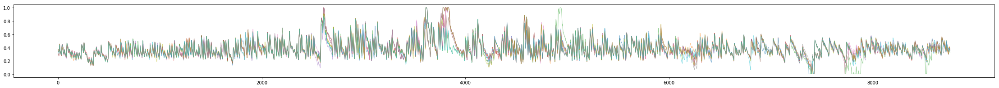

15
0.99
2000
1562228129.768227
LOSS : 2.958
LOSS : 2.842
LOSS : 2.916
LOSS : 2.855
LOSS : 2.847
LOSS : 2.915
LOSS : 2.876
LOSS : 2.886
LOSS : 2.858
LOSS : 2.887
LOSS : 2.903
LOSS : 2.889
LOSS : 3.014
LOSS : 2.831
LOSS : 2.775
LOSS : 2.756
LOSS : 2.747
LOSS : 2.762
LOSS : 2.581
LOSS : 2.507
LOSS : 2.500
LOSS : 2.437
LOSS : 2.510
LOSS : 2.477
LOSS : 2.458
LOSS : 2.515
LOSS : 2.435
LOSS : 2.354
LOSS : 2.480
LOSS : 2.428
LOSS : 2.390
LOSS : 2.391
LOSS : 2.451
LOSS : 2.333
LOSS : 2.365
LOSS : 2.389
LOSS : 2.247
LOSS : 2.273
LOSS : 2.349
LOSS : 2.255
LOSS : 2.239
LOSS : 2.356
LOSS : 2.278
LOSS : 2.352
LOSS : 2.232
LOSS : 2.195
LOSS : 2.305
LOSS : 2.188
LOSS : 2.196
LOSS : 2.080
LOSS : 2.047
LOSS : 2.089
LOSS : 2.109
LOSS : 2.078
LOSS : 2.070
LOSS : 2.053
LOSS : 1.967
LOSS : 2.006
LOSS : 1.973
LOSS : 1.909
LOSS : 1.774
LOSS : 1.876
LOSS : 1.835
LOSS : 1.829
LOSS : 1.881
LOSS : 1.928
LOSS : 1.869
LOSS : 1.868
LOSS : 1.862
LOSS : 1.884
LOSS : 1.883
LOSS : 1.892


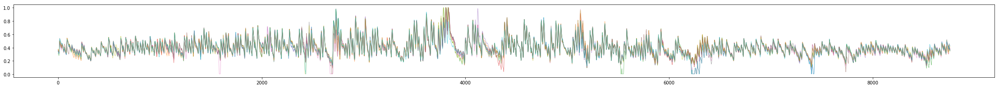

16
0.99
2000
1562228800.9612079
LOSS : 1.891
LOSS : 1.852
LOSS : 1.879
LOSS : 1.785
LOSS : 1.879
LOSS : 1.873
LOSS : 1.714
LOSS : 1.736
LOSS : 1.680
LOSS : 1.649
LOSS : 1.581
LOSS : 1.620
LOSS : 1.568
LOSS : 1.555
LOSS : 1.593
LOSS : 1.537
LOSS : 1.506
LOSS : 1.477
LOSS : 1.488
LOSS : 1.463
LOSS : 1.480
LOSS : 1.496
LOSS : 1.467
LOSS : 1.485
LOSS : 1.504
LOSS : 1.530
LOSS : 1.507
LOSS : 1.508
LOSS : 1.530
LOSS : 1.507
LOSS : 1.589
LOSS : 1.546
LOSS : 1.514
LOSS : 1.594
LOSS : 1.501
LOSS : 1.541
LOSS : 1.540
LOSS : 1.601
LOSS : 1.522
LOSS : 1.532
LOSS : 1.490
LOSS : 1.480
LOSS : 1.498
LOSS : 1.515
LOSS : 1.492
LOSS : 1.454
LOSS : 1.414
LOSS : 1.514
LOSS : 1.439
LOSS : 1.442
LOSS : 1.459
LOSS : 1.502
LOSS : 1.478
LOSS : 1.464
LOSS : 1.447
LOSS : 1.377
LOSS : 1.407
LOSS : 1.469
LOSS : 1.307
LOSS : 1.374
LOSS : 1.339
LOSS : 1.324
LOSS : 1.398
LOSS : 1.395
LOSS : 1.427
LOSS : 1.379
LOSS : 1.414
LOSS : 1.394
LOSS : 1.429
LOSS : 1.450
LOSS : 1.460
LOSS : 1.497
LOSS : 1.510


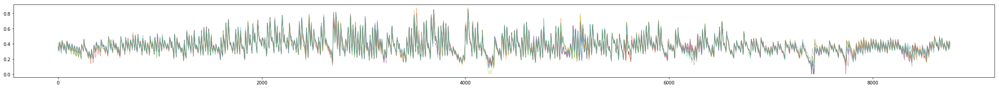

17
0.99
2000
1562229471.2180495
LOSS : 1.518
LOSS : 1.489
LOSS : 1.485
LOSS : 1.488
LOSS : 1.543
LOSS : 1.469
LOSS : 1.471
LOSS : 1.453
LOSS : 1.458
LOSS : 1.419
LOSS : 1.381
LOSS : 1.396
LOSS : 1.368
LOSS : 1.406
LOSS : 1.380
LOSS : 1.419
LOSS : 1.339
LOSS : 1.381
LOSS : 1.315
LOSS : 1.383
LOSS : 1.294
LOSS : 1.310
LOSS : 1.342
LOSS : 1.314
LOSS : 1.388
LOSS : 1.407
LOSS : 1.405
LOSS : 1.426
LOSS : 1.368
LOSS : 1.352
LOSS : 1.388
LOSS : 1.405
LOSS : 1.382
LOSS : 1.405
LOSS : 1.368
LOSS : 1.397
LOSS : 1.389
LOSS : 1.454
LOSS : 1.410
LOSS : 1.362
LOSS : 1.305
LOSS : 1.318
LOSS : 1.273
LOSS : 1.247
LOSS : 1.271
LOSS : 1.208
LOSS : 1.227
LOSS : 1.191
LOSS : 1.173
LOSS : 1.189
LOSS : 1.210
LOSS : 1.216
LOSS : 1.172
LOSS : 1.245
LOSS : 1.184
LOSS : 1.194
LOSS : 1.182
LOSS : 1.161
LOSS : 1.149
LOSS : 1.211
LOSS : 1.169
LOSS : 1.173
LOSS : 1.209
LOSS : 1.259
LOSS : 1.236
LOSS : 1.151
LOSS : 1.214
LOSS : 1.167
LOSS : 1.266
LOSS : 1.191
LOSS : 1.211
LOSS : 1.247


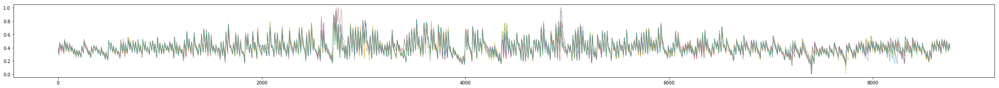

18
0.99
2000
1562230142.2548428
LOSS : 1.212
LOSS : 1.190
LOSS : 1.234
LOSS : 1.211
LOSS : 1.196
LOSS : 1.177
LOSS : 1.147
LOSS : 1.148
LOSS : 1.149
LOSS : 1.146
LOSS : 1.188
LOSS : 1.179
LOSS : 1.141
LOSS : 1.108
LOSS : 1.112
LOSS : 1.126
LOSS : 1.105
LOSS : 1.134
LOSS : 1.085
LOSS : 1.134
LOSS : 1.109
LOSS : 1.112
LOSS : 1.095
LOSS : 1.123
LOSS : 1.119
LOSS : 1.172
LOSS : 1.097
LOSS : 1.121
LOSS : 1.151
LOSS : 1.075
LOSS : 1.090
LOSS : 1.075
LOSS : 1.059
LOSS : 1.043
LOSS : 1.068
LOSS : 1.058
LOSS : 1.056
LOSS : 1.009
LOSS : 1.027
LOSS : 0.979
LOSS : 1.042
LOSS : 0.999
LOSS : 1.006
LOSS : 1.003
LOSS : 0.947
LOSS : 0.964
LOSS : 0.938
LOSS : 0.899
LOSS : 0.889
LOSS : 0.885
LOSS : 0.873
LOSS : 0.884
LOSS : 0.908
LOSS : 0.913
LOSS : 0.871
LOSS : 0.896
LOSS : 0.897
LOSS : 0.884
LOSS : 0.861
LOSS : 0.890
LOSS : 0.868
LOSS : 0.897
LOSS : 0.904
LOSS : 0.911
LOSS : 0.910
LOSS : 0.912
LOSS : 0.898
LOSS : 0.960
LOSS : 0.925
LOSS : 0.929
LOSS : 0.924
LOSS : 0.955


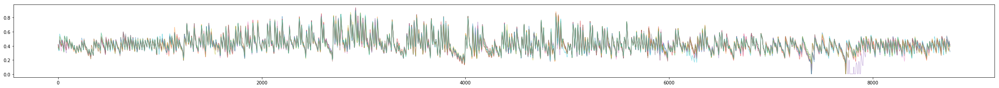

19
0.99
2000
1562230819.595852
LOSS : 1.005
LOSS : 0.995
LOSS : 1.009
LOSS : 0.989
LOSS : 1.075
LOSS : 1.011
LOSS : 0.971
LOSS : 1.002
LOSS : 0.969
LOSS : 0.983
LOSS : 0.965
LOSS : 0.974
LOSS : 1.019
LOSS : 1.014
LOSS : 0.978
LOSS : 1.015
LOSS : 0.965
LOSS : 0.946
LOSS : 0.941
LOSS : 0.903
LOSS : 0.936
LOSS : 0.972
LOSS : 0.940
LOSS : 0.980
LOSS : 0.965
LOSS : 0.952
LOSS : 0.940
LOSS : 0.936
LOSS : 0.940
LOSS : 0.908
LOSS : 0.889
LOSS : 0.884
LOSS : 0.858
LOSS : 0.844
LOSS : 0.860
LOSS : 0.847
LOSS : 0.795
LOSS : 0.774
LOSS : 0.784
LOSS : 0.746
LOSS : 0.749
LOSS : 0.773
LOSS : 0.765
LOSS : 0.751
LOSS : 0.730
LOSS : 0.724
LOSS : 0.718
LOSS : 0.641
LOSS : 0.639
LOSS : 0.621
LOSS : 0.595
LOSS : 0.597
LOSS : 0.585
LOSS : 0.570
LOSS : 0.547
LOSS : 0.539
LOSS : 0.537
LOSS : 0.532
LOSS : 0.538
LOSS : 0.521
LOSS : 0.537
LOSS : 0.559
LOSS : 0.642
LOSS : 0.711
LOSS : 0.798
LOSS : 0.868
LOSS : 0.930
LOSS : 0.976
LOSS : 0.982
LOSS : 0.984
LOSS : 0.995
LOSS : 0.925
LOSS : 0.951


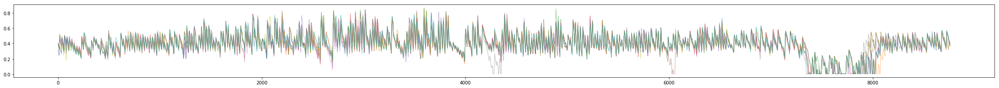

In [25]:
from figplot import figplot

ANNUAL_MEMORY = []
TOTAL_MEMORY = []

yr = 2000
dummy1 = CAPM(LOCATION, yr)
dummy1.eno = ENO(LOCATION, yr)
dummy1.HMAX = dummy1.eno.SMAX
dummy1.reset()
capm_list = [dummy1]*NO_OF_NODES

for iteration in range(20):
    
    print(iteration)
    
    e_slope = 0.1
    e_start = 0.1
    sc_EPSILON = np.clip(e_start + e_slope*iteration,0.1,0.99)
    print(sc_EPSILON)
    ANNUAL_MEMORY.clear()

    for cpm in capm_list:
        cpm.eno.day = 0
    print(capm_list[0].year)
    
    stat = os.stat(MODEL_FILENAME)
    print(stat.st_mtime)
    
    for day in range(365):
        
        
        day_list = [day]*NO_OF_NODES
        sc_EPSILON_list = [sc_EPSILON]*NO_OF_NODES
        param_list = [MODEL_FILENAME]*NO_OF_NODES
        arglist = [arg for arg in zip(range(NO_OF_NODES), day_list, sc_EPSILON_list, param_list, capm_list)]
        result = pool.starmap(T_ENO, arglist)

        node_experience  = np.array([item[0] for item in result])
        capm_list = [item[1] for item in result]

        ANNUAL_MEMORY.append(node_experience)
        TOTAL_MEMORY.append(node_experience)
        all_exp = np.array([item for each_node_exp in node_experience 
                                    for episode_exp in each_node_exp 
                                        for item in episode_exp]).reshape(-1,10)

        dqn.memory = np.insert(dqn.memory, 0, all_exp , 0)
        dqn.memory = dqn.memory[:MEMORY_CAPACITY,:]
        dqn.memory_counter += all_exp.shape[0]


        if dqn.memory_counter > 24*7:#MEMORY_CAPACITY:
            for nn_iter in range(NN_ITERATIONS):
                dqn.learn()
            # SAVE MODEL
            torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)

    AN_NUAL_MEMORY = np.array(ANNUAL_MEMORY)
    MEM = np.einsum('dnes->ndes',AN_NUAL_MEMORY)
    #single file all data
    STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
    ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
    REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)
    #Destandardize state values from memory
    DSTD_STATES = batch_destdize(STATES)
    #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
    NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
    NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)

    plt.figure(figsize=(39,3))
    for i in range(NO_OF_NODES):
        plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
    plt.show()


pool.close()
pool.join()
    
    

In [26]:
# TOTAL_MEMORY = np.array(TOTAL_MEMORY)

# MEM = np.einsum('dnes->ndes',TOTAL_MEMORY)

# #single file all data
# STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
# ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
# REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)

In [27]:
# #Destandardize state values from memory
# DSTD_STATES = batch_destdize(STATES)

In [28]:
# #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
# NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
# NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)
# # np.save('DENO',NODE_MEMS)


In [29]:
# plt.figure(figsize=(24,3))
# plt.plot(node_0[:,0],'r')
# # plt.plot(z[:,1])
# plt.plot(node_0[:,2],'c',alpha=0.4)
# # plt.plot(node_0[:,3],'b')
# plt.plot(node_0[:,4]/9,'b')
# # plt.plot(node_0[:,5],'k--')
# plt.minorticks_on()

# plt.grid(which='both',axis='x')

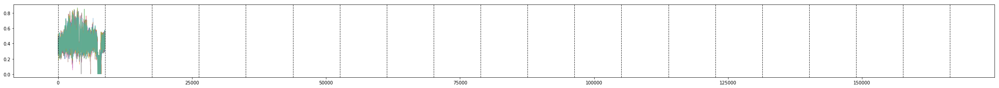

In [30]:
plt.figure(figsize=(39,3))
for i in range(NO_OF_NODES):
    plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.8)



In [31]:
batt = NODE_MEMS[:,:,0]

In [32]:
downtime_occur = (batt < 0.006).astype(int)
overflow_occur = (batt == 1).astype(int)

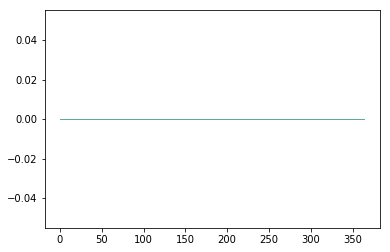

In [33]:
#DOWNTIME PER NODE WITH TIME
for i in range(NO_OF_NODES):
    plt.plot(downtime_occur[i,0:365].cumsum(), alpha=0.5, linewidth=1.0)

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

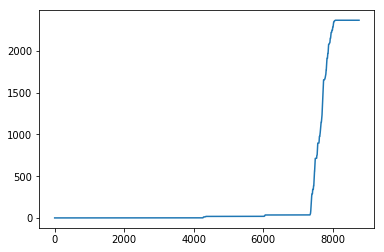

In [34]:
# OVERALL DOWNTIME OF SYSTEM

total_downtime = downtime_occur.sum(axis=0)
plt.plot(total_downtime.cumsum())

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

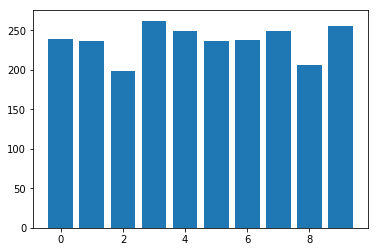

In [35]:
# TOTAL DOWNTIME PER NODE

total_downtime = downtime_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_downtime)

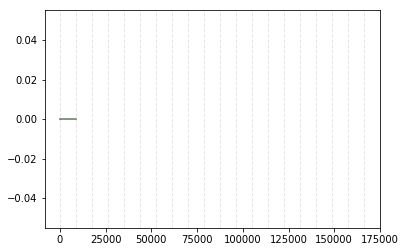

In [36]:
#OVERFLOW PER NODE WITH TIME

for i in range(NO_OF_NODES):
    plt.plot(overflow_occur[i,:].cumsum(), alpha=0.5, linewidth=1.0)
    
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

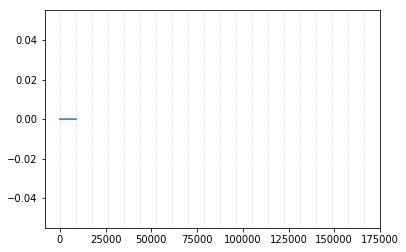

In [37]:
# OVERALL OVERFLOW OF SYSTEM

total_overflow = overflow_occur.sum(axis=0)
plt.plot(total_overflow.cumsum())

for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

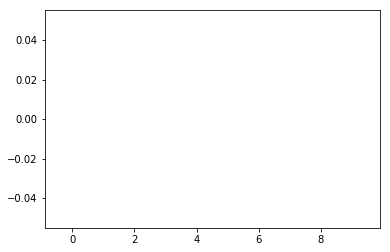

In [38]:
# TOTAL OVERFLOW  PER NODE

total_overflow = overflow_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_overflow)

In [39]:
S_FILENAME = MODEL_FILENAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/DENOSTI6WR1Z__05_27_52__161.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


************************************
Day Violations           =     59
Battery Limit Violations =    951
Battery FULL Violations  =      0
Battery EMPTY Violations =    951


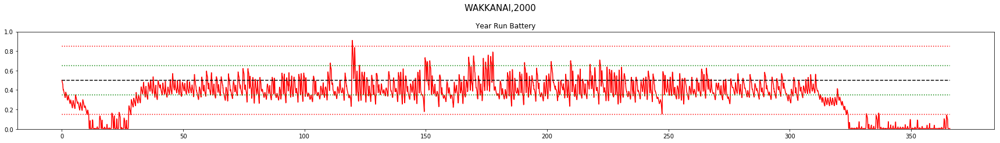



************************************
Day Violations           =     84
Battery Limit Violations =   1235
Battery FULL Violations  =      0
Battery EMPTY Violations =   1235


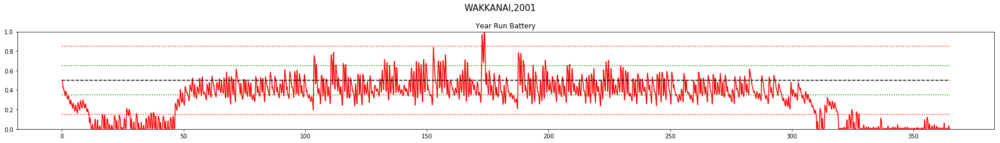



************************************
Day Violations           =     59
Battery Limit Violations =   1000
Battery FULL Violations  =      0
Battery EMPTY Violations =   1000


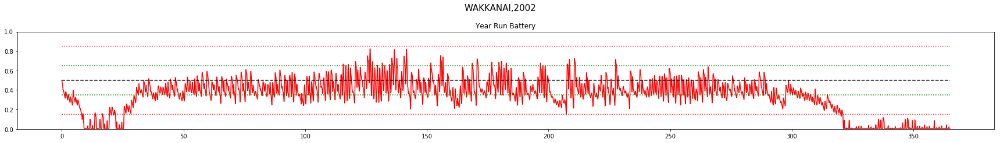



************************************
Day Violations           =     44
Battery Limit Violations =    741
Battery FULL Violations  =      0
Battery EMPTY Violations =    741


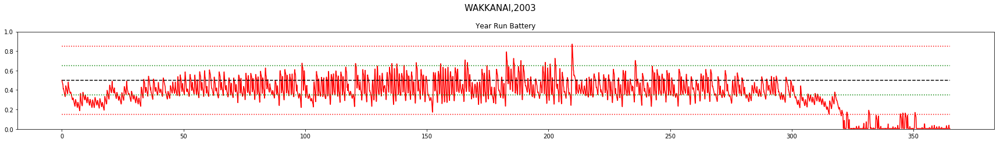



************************************
Day Violations           =     73
Battery Limit Violations =   1075
Battery FULL Violations  =      5
Battery EMPTY Violations =   1070


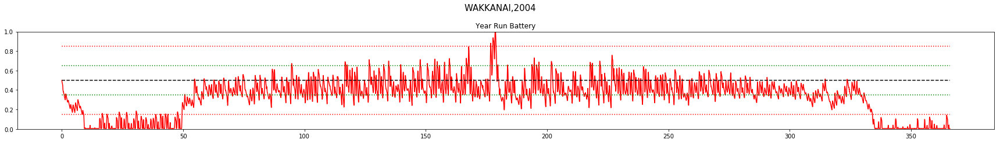



************************************
Day Violations           =     62
Battery Limit Violations =    908
Battery FULL Violations  =      0
Battery EMPTY Violations =    908


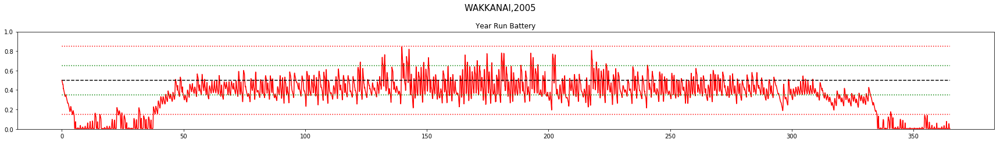



************************************
Day Violations           =     51
Battery Limit Violations =    834
Battery FULL Violations  =     23
Battery EMPTY Violations =    811


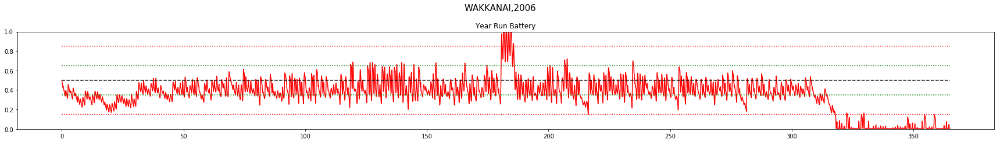



************************************
Day Violations           =     42
Battery Limit Violations =    699
Battery FULL Violations  =      0
Battery EMPTY Violations =    699


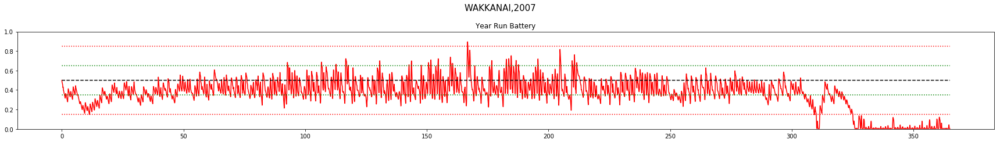



************************************
Day Violations           =     65
Battery Limit Violations =   1039
Battery FULL Violations  =      0
Battery EMPTY Violations =   1039


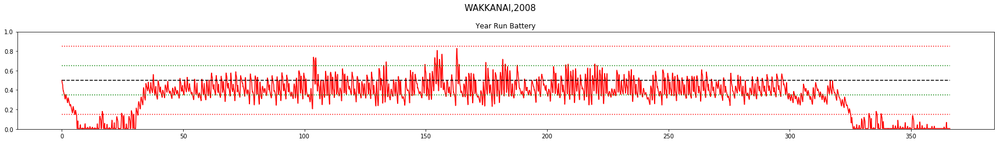



************************************
Day Violations           =     76
Battery Limit Violations =   1135
Battery FULL Violations  =      0
Battery EMPTY Violations =   1135


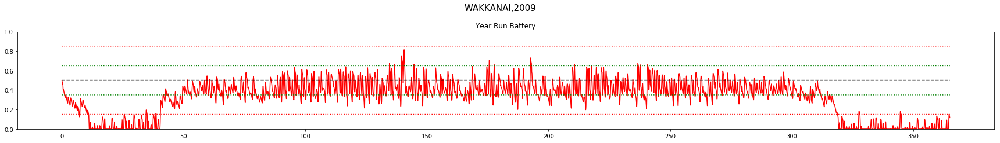



************************************
Day Violations           =     59
Battery Limit Violations =    879
Battery FULL Violations  =      0
Battery EMPTY Violations =    879


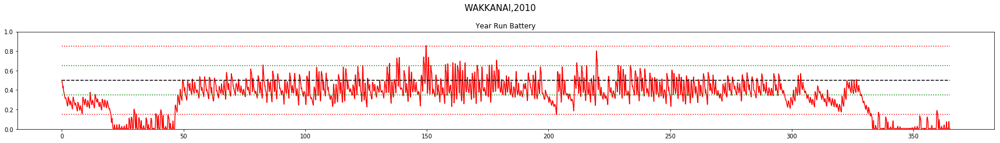



************************************
Day Violations           =     63
Battery Limit Violations =    930
Battery FULL Violations  =     10
Battery EMPTY Violations =    920


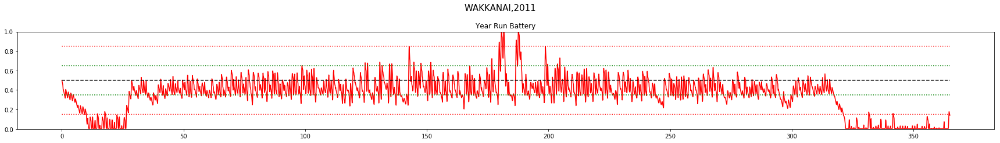



************************************
Day Violations           =     99
Battery Limit Violations =   1569
Battery FULL Violations  =      0
Battery EMPTY Violations =   1569


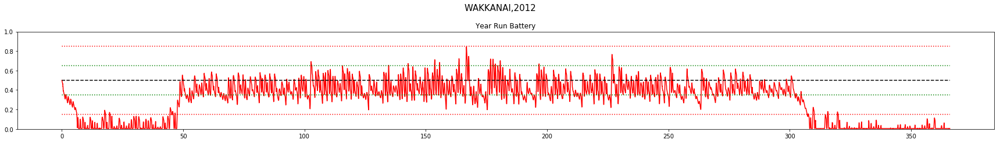



************************************
Day Violations           =     73
Battery Limit Violations =   1118
Battery FULL Violations  =      4
Battery EMPTY Violations =   1114


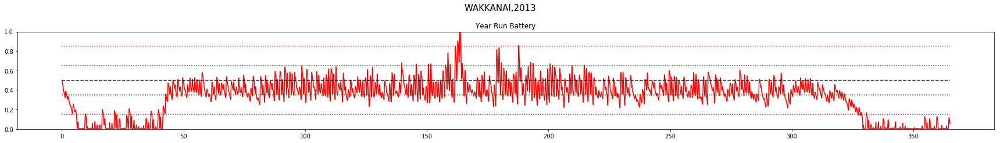



************************************
Day Violations           =     77
Battery Limit Violations =   1042
Battery FULL Violations  =      0
Battery EMPTY Violations =   1042


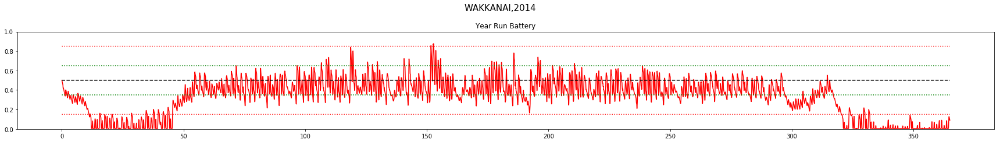



************************************
Day Violations           =     61
Battery Limit Violations =    878
Battery FULL Violations  =      0
Battery EMPTY Violations =    878


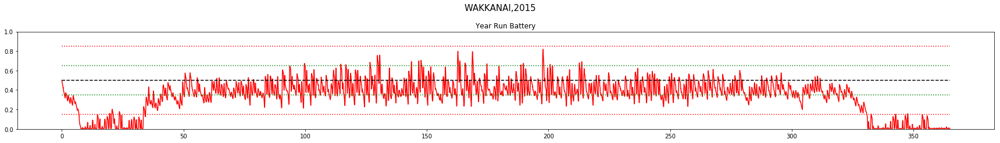



************************************
Day Violations           =     94
Battery Limit Violations =   1393
Battery FULL Violations  =      0
Battery EMPTY Violations =   1393


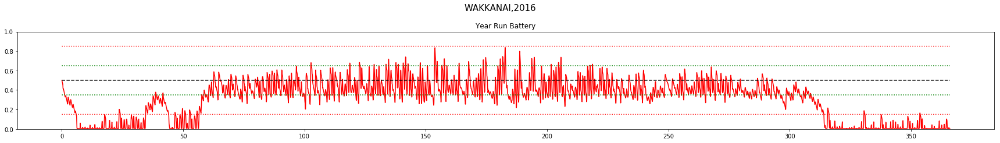



************************************
Day Violations           =     82
Battery Limit Violations =   1262
Battery FULL Violations  =      0
Battery EMPTY Violations =   1262


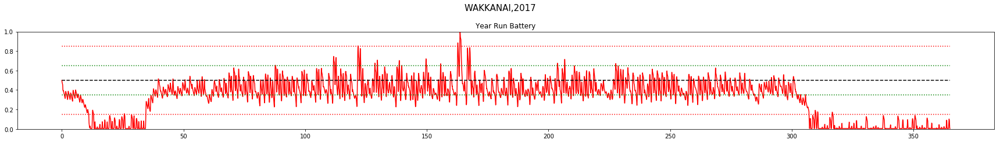



************************************
Day Violations           =     66
Battery Limit Violations =   1047
Battery FULL Violations  =     14
Battery EMPTY Violations =   1033


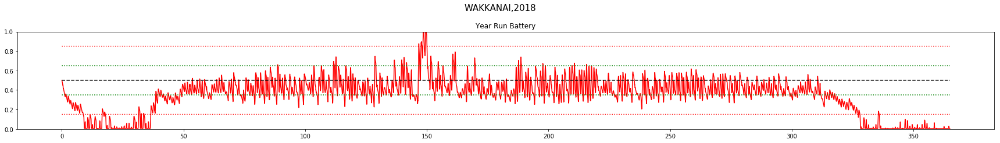



WAKKANAI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.66		59	 951	951	0
2001	 0.53		84	 1235	1235	0
2002	 0.63		59	 1000	1000	0
2003	 0.73		44	 741	741	0
2004	 0.59		73	 1075	1070	5
2005	 0.65		62	 908	908	0
2006	 0.7		51	 834	811	23
2007	 0.74		42	 699	699	0
2008	 0.64		65	 1039	1039	0
2009	 0.58		76	 1135	1135	0
2010	 0.63		59	 879	879	0
2011	 0.65		63	 930	920	10
2012	 0.48		99	 1569	1569	0
2013	 0.6		73	 1118	1114	4
2014	 0.57		77	 1042	1042	0
2015	 0.66		61	 878	878	0
2016	 0.49		94	 1393	1393	0
2017	 0.57		82	 1262	1262	0
2018	 0.62		66	 1047	1033	14

TOTAL Day  Violations:   1289.0
TOTAL Batt  Violations:  19735.0
TOTAL EMPTY Violations:  19679.0
TOTAL FULL  Violations:  56.0
************************************


************************************
Day Violations           =     37
Battery Limit Violations =    486
Battery FULL Violations  =      0
Battery EMPTY Violations =    486


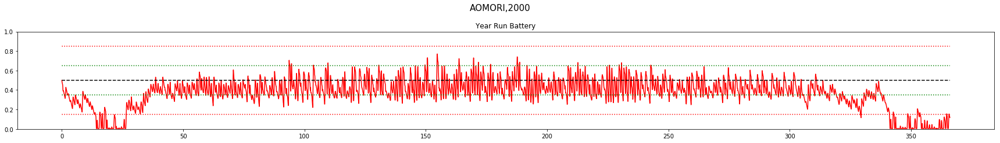



************************************
Day Violations           =     22
Battery Limit Violations =    315
Battery FULL Violations  =      0
Battery EMPTY Violations =    315


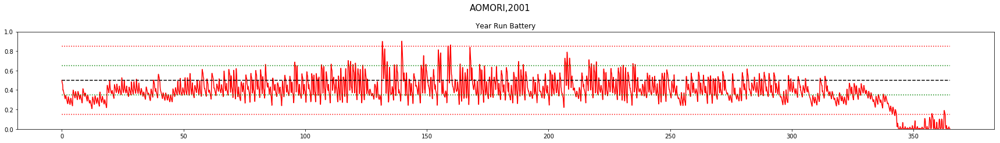



************************************
Day Violations           =     29
Battery Limit Violations =    315
Battery FULL Violations  =      0
Battery EMPTY Violations =    315


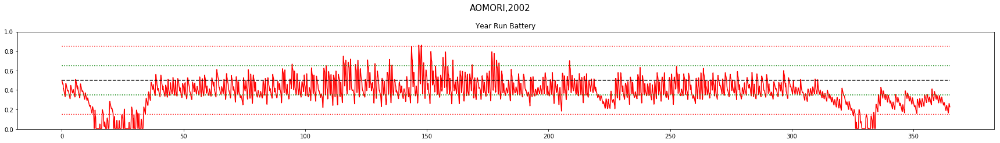



************************************
Day Violations           =     21
Battery Limit Violations =    312
Battery FULL Violations  =      0
Battery EMPTY Violations =    312


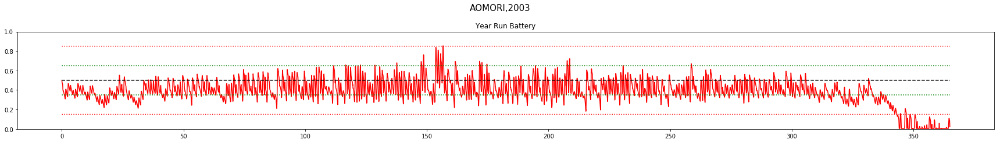



************************************
Day Violations           =      4
Battery Limit Violations =     47
Battery FULL Violations  =      0
Battery EMPTY Violations =     47


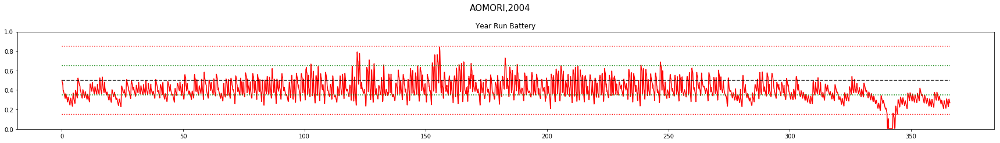



************************************
Day Violations           =     53
Battery Limit Violations =    657
Battery FULL Violations  =      0
Battery EMPTY Violations =    657


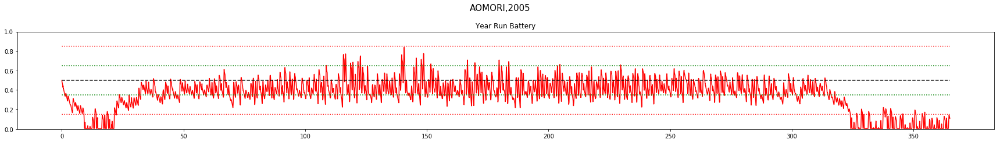



************************************
Day Violations           =     45
Battery Limit Violations =    640
Battery FULL Violations  =      0
Battery EMPTY Violations =    640


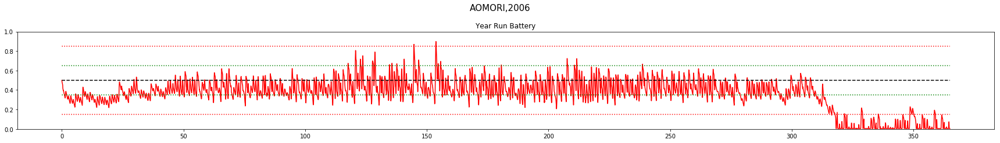



************************************
Day Violations           =      5
Battery Limit Violations =     53
Battery FULL Violations  =      0
Battery EMPTY Violations =     53


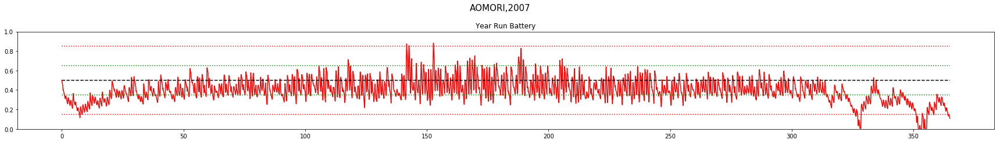



************************************
Day Violations           =     30
Battery Limit Violations =    407
Battery FULL Violations  =      0
Battery EMPTY Violations =    407


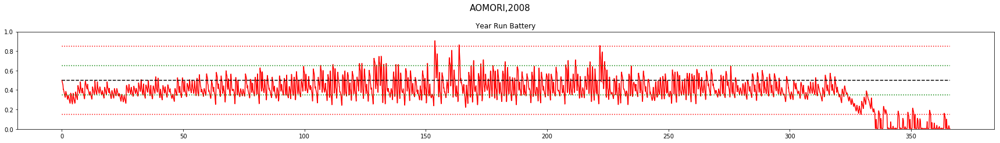



************************************
Day Violations           =     21
Battery Limit Violations =    281
Battery FULL Violations  =      0
Battery EMPTY Violations =    281


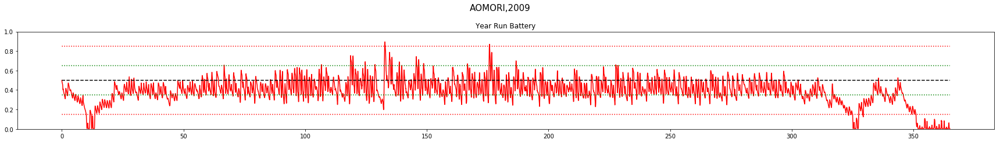



************************************
Day Violations           =     10
Battery Limit Violations =    118
Battery FULL Violations  =      0
Battery EMPTY Violations =    118


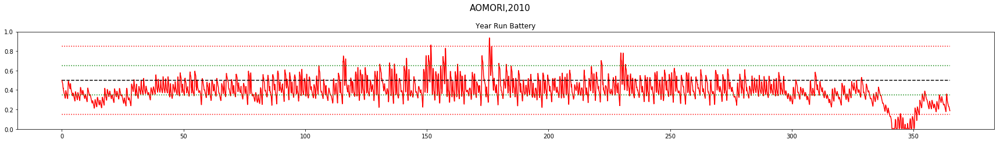



************************************
Day Violations           =     32
Battery Limit Violations =    463
Battery FULL Violations  =      0
Battery EMPTY Violations =    463


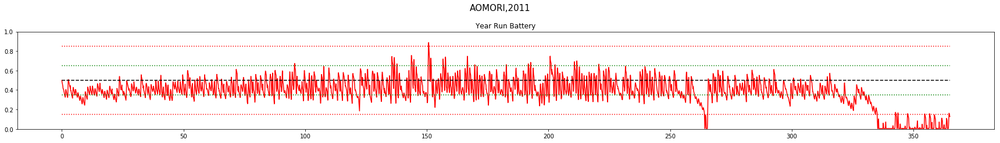



************************************
Day Violations           =     32
Battery Limit Violations =    393
Battery FULL Violations  =     23
Battery EMPTY Violations =    370


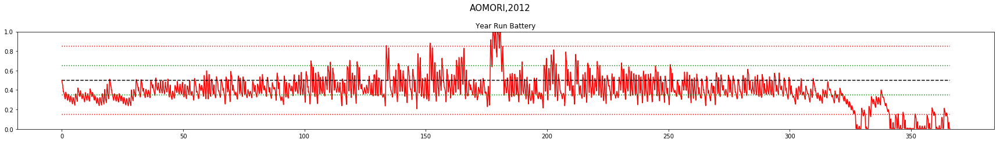



************************************
Day Violations           =     26
Battery Limit Violations =    343
Battery FULL Violations  =      0
Battery EMPTY Violations =    343


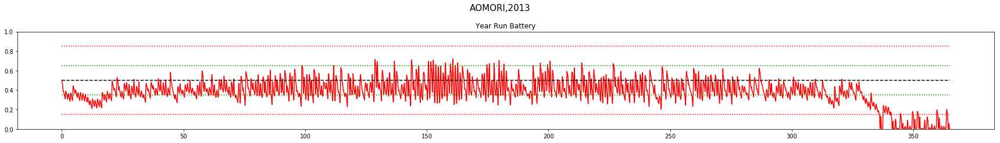



************************************
Day Violations           =     25
Battery Limit Violations =    375
Battery FULL Violations  =      0
Battery EMPTY Violations =    375


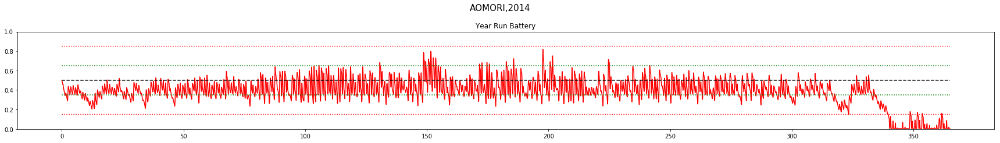



************************************
Day Violations           =     33
Battery Limit Violations =    473
Battery FULL Violations  =      0
Battery EMPTY Violations =    473


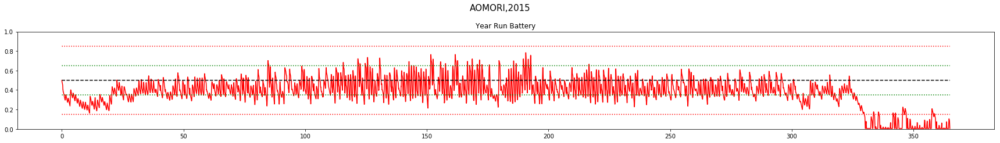



************************************
Day Violations           =     44
Battery Limit Violations =    480
Battery FULL Violations  =      3
Battery EMPTY Violations =    477


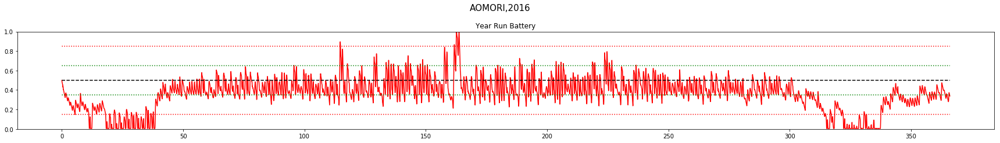



************************************
Day Violations           =     34
Battery Limit Violations =    433
Battery FULL Violations  =      2
Battery EMPTY Violations =    431


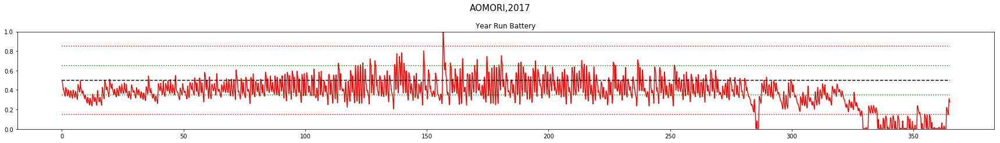



************************************
Day Violations           =     21
Battery Limit Violations =    243
Battery FULL Violations  =     13
Battery EMPTY Violations =    230


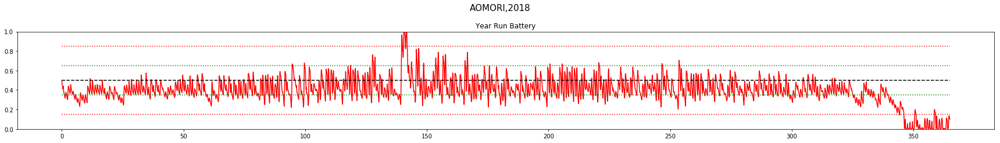



AOMORI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.76		37	 486	486	0
2001	 0.85		22	 315	315	0
2002	 0.8		29	 315	315	0
2003	 0.86		21	 312	312	0
2004	 0.94		4	 47	47	0
2005	 0.7		53	 657	657	0
2006	 0.74		45	 640	640	0
2007	 0.88		5	 53	53	0
2008	 0.83		30	 407	407	0
2009	 0.83		21	 281	281	0
2010	 0.9		10	 118	118	0
2011	 0.82		32	 463	463	0
2012	 0.81		32	 393	370	23
2013	 0.84		26	 343	343	0
2014	 0.84		25	 375	375	0
2015	 0.79		33	 473	473	0
2016	 0.72		44	 480	477	3
2017	 0.78		34	 433	431	2
2018	 0.88		21	 243	230	13

TOTAL Day  Violations:   524.0
TOTAL Batt  Violations:  6834.0
TOTAL EMPTY Violations:  6793.0
TOTAL FULL  Violations:  41.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


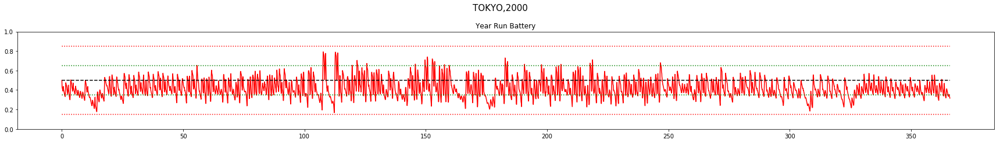



************************************
Day Violations           =      2
Battery Limit Violations =     10
Battery FULL Violations  =      0
Battery EMPTY Violations =     10


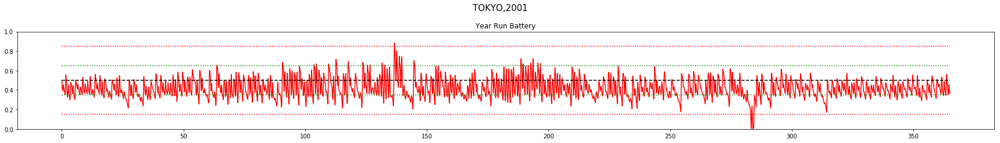



************************************
Day Violations           =      2
Battery Limit Violations =     18
Battery FULL Violations  =      0
Battery EMPTY Violations =     18


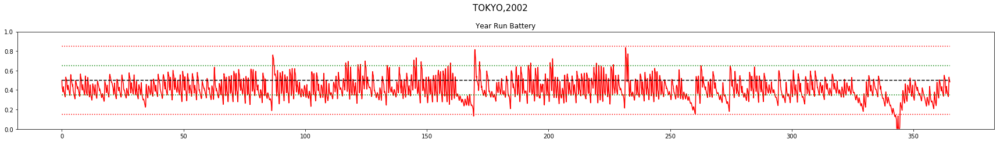



************************************
Day Violations           =      8
Battery Limit Violations =     90
Battery FULL Violations  =      0
Battery EMPTY Violations =     90


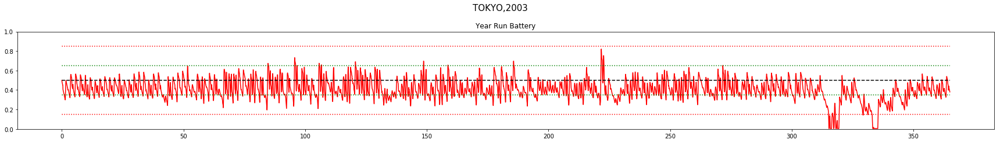



************************************
Day Violations           =      2
Battery Limit Violations =     15
Battery FULL Violations  =      0
Battery EMPTY Violations =     15


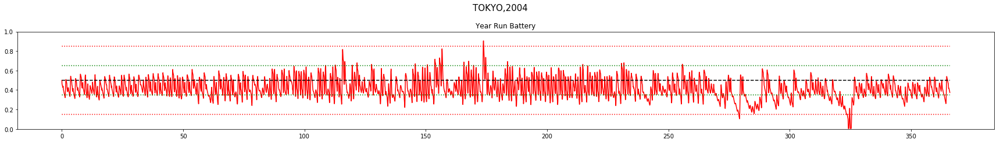



************************************
Day Violations           =      2
Battery Limit Violations =     19
Battery FULL Violations  =      0
Battery EMPTY Violations =     19


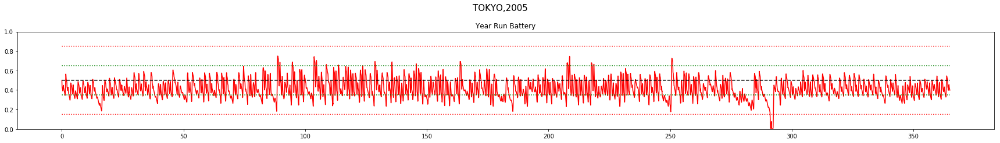



************************************
Day Violations           =     12
Battery Limit Violations =    110
Battery FULL Violations  =      0
Battery EMPTY Violations =    110


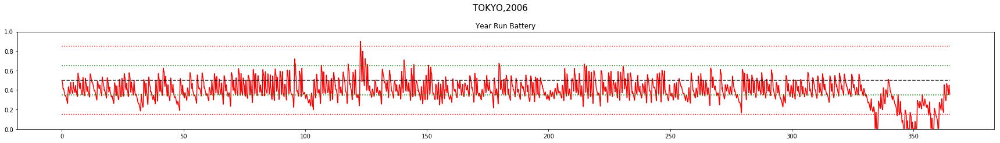



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


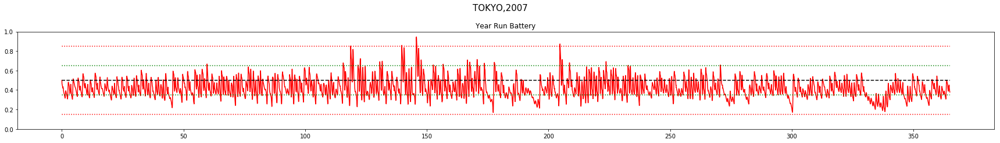



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


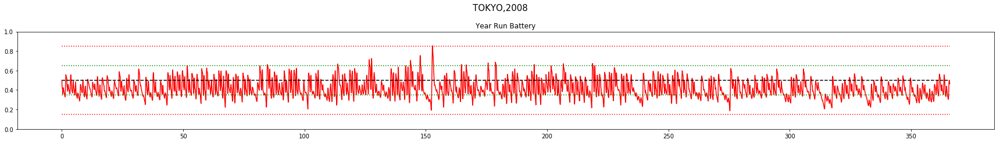



************************************
Day Violations           =      3
Battery Limit Violations =     19
Battery FULL Violations  =      0
Battery EMPTY Violations =     19


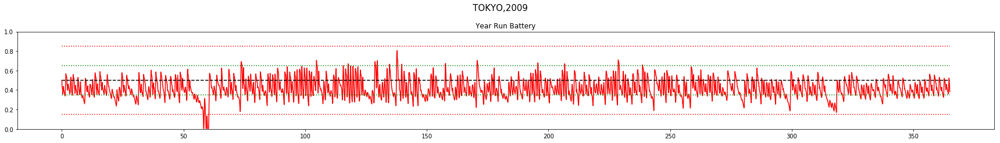



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


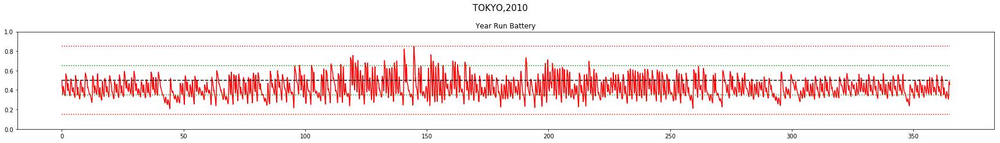



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


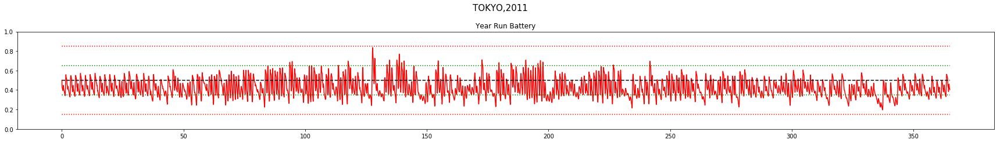



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


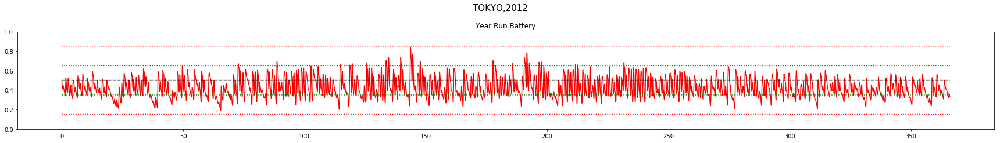



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


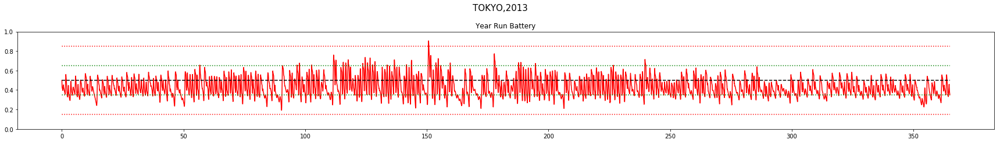



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


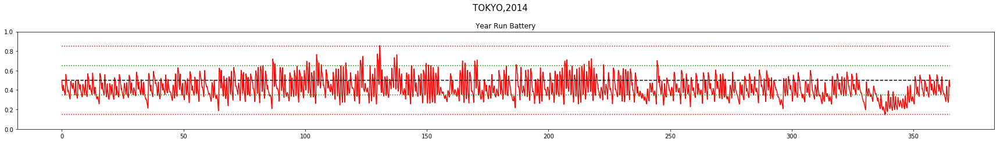



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


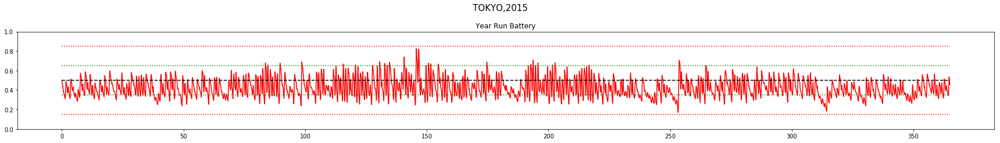



************************************
Day Violations           =      1
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


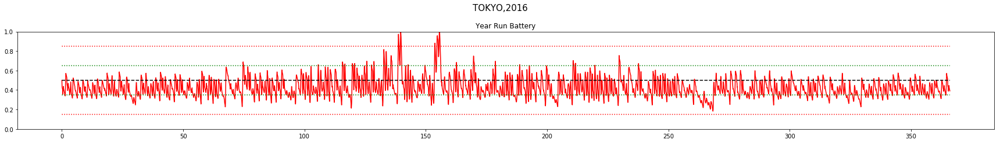



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


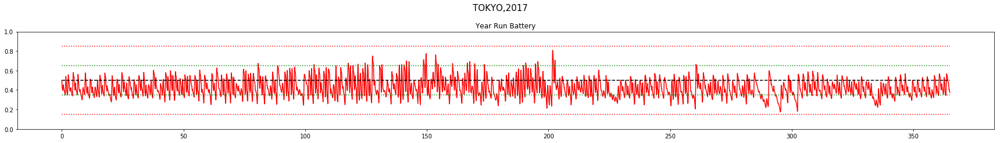



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


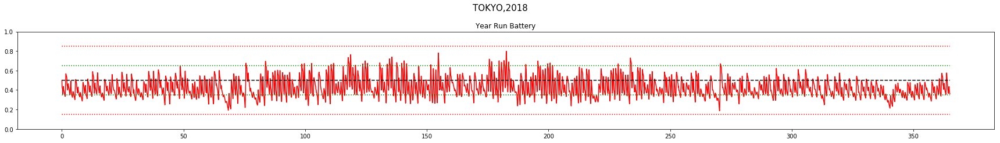



TOKYO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.98		0	 0	0	0
2001	 0.98		2	 10	10	0
2002	 0.95		2	 18	18	0
2003	 0.93		8	 90	90	0
2004	 0.95		2	 15	15	0
2005	 0.97		2	 19	19	0
2006	 0.9		12	 110	110	0
2007	 0.98		0	 0	0	0
2008	 0.99		0	 0	0	0
2009	 0.97		3	 19	19	0
2010	 0.99		0	 0	0	0
2011	 0.99		0	 0	0	0
2012	 0.99		0	 0	0	0
2013	 0.99		0	 0	0	0
2014	 0.97		0	 0	0	0
2015	 0.99		0	 0	0	0
2016	 0.98		1	 3	0	3
2017	 0.99		0	 0	0	0
2018	 0.99		0	 0	0	0

TOTAL Day  Violations:   32.0
TOTAL Batt  Violations:  284.0
TOTAL EMPTY Violations:  281.0
TOTAL FULL  Violations:  3.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


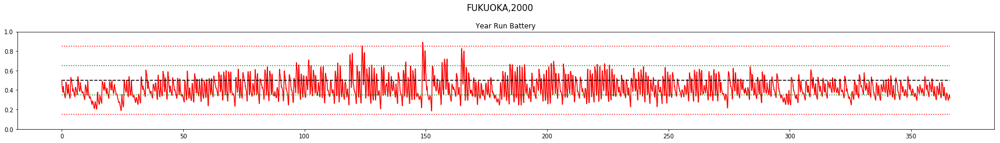



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


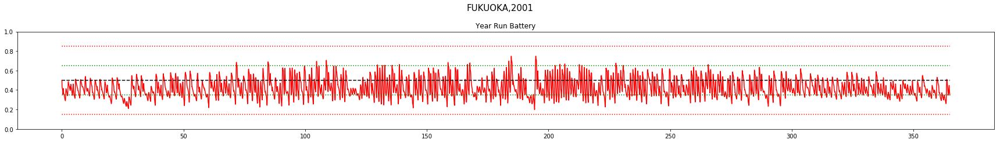



************************************
Day Violations           =      1
Battery Limit Violations =      4
Battery FULL Violations  =      0
Battery EMPTY Violations =      4


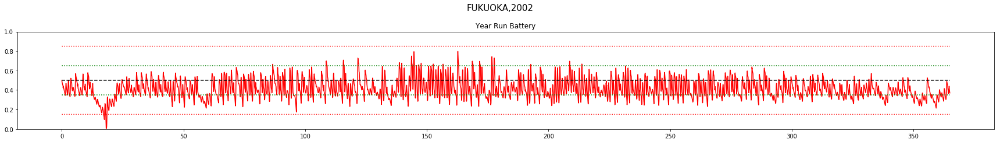



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


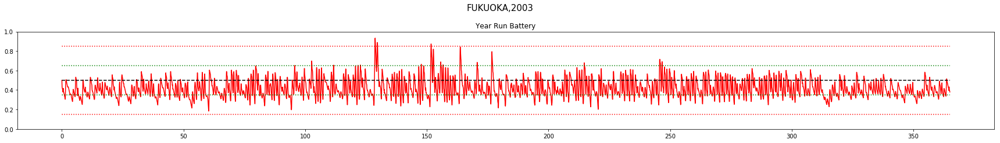



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


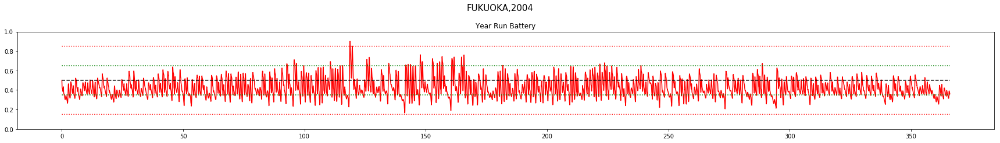



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


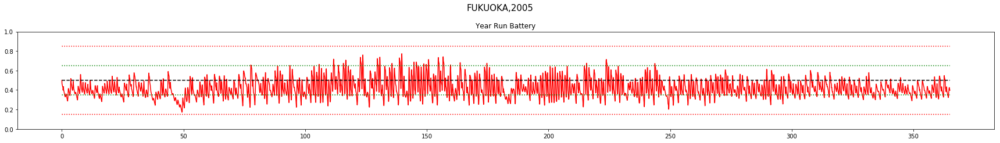



************************************
Day Violations           =      5
Battery Limit Violations =     56
Battery FULL Violations  =      0
Battery EMPTY Violations =     56


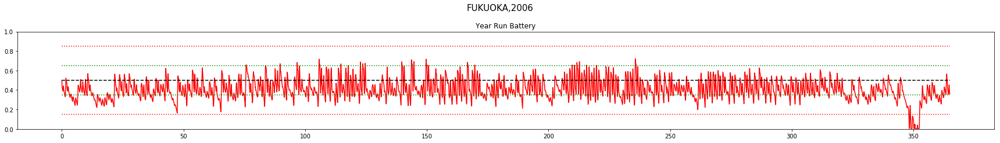



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


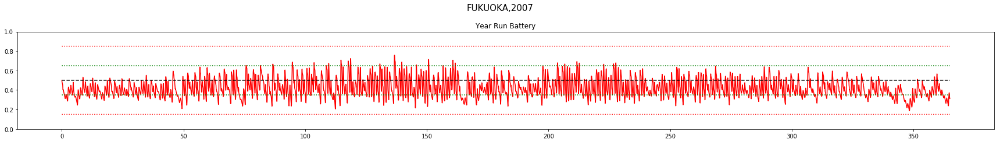



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


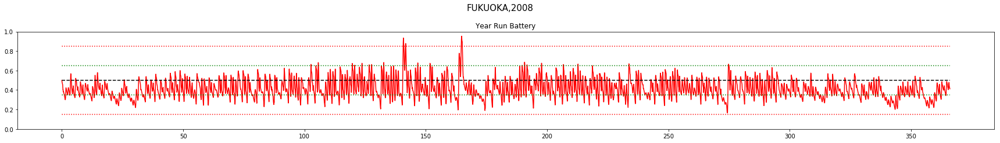



************************************
Day Violations           =      9
Battery Limit Violations =     89
Battery FULL Violations  =      6
Battery EMPTY Violations =     83


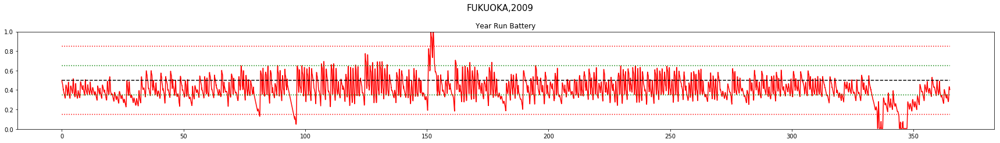



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


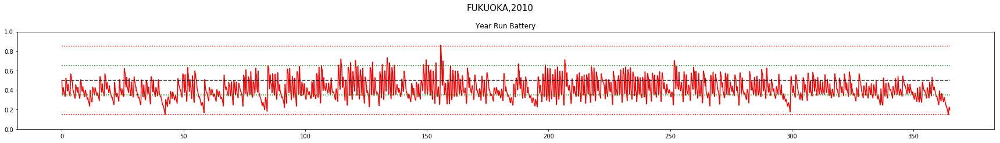



************************************
Day Violations           =     16
Battery Limit Violations =    172
Battery FULL Violations  =      0
Battery EMPTY Violations =    172


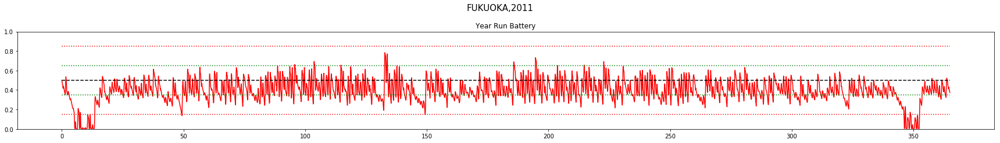



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


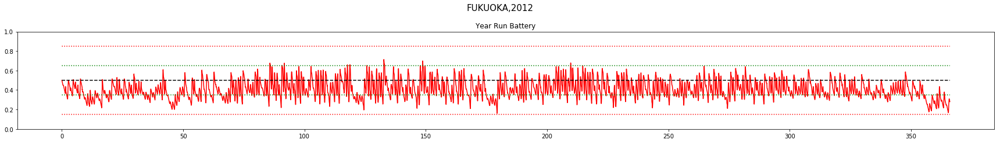



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


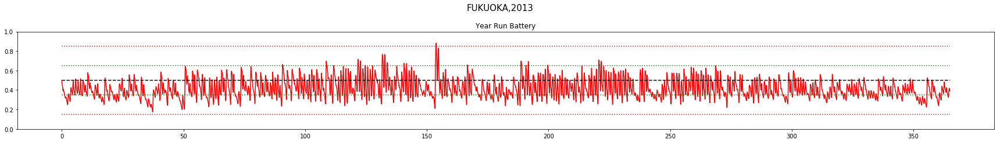



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


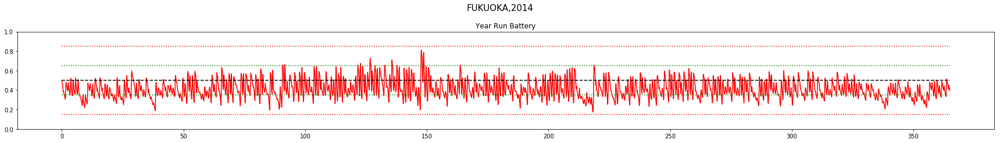



************************************
Day Violations           =      3
Battery Limit Violations =     32
Battery FULL Violations  =      0
Battery EMPTY Violations =     32


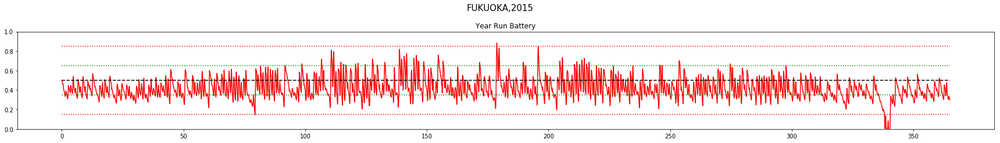



************************************
Day Violations           =      5
Battery Limit Violations =     78
Battery FULL Violations  =      0
Battery EMPTY Violations =     78


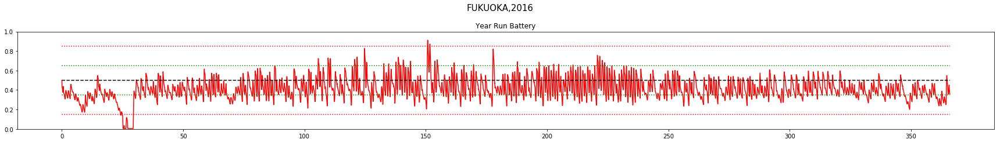



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


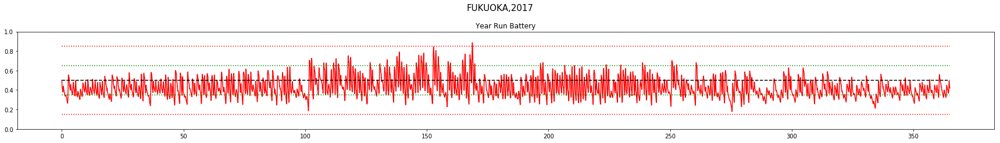



************************************
Day Violations           =      1
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0


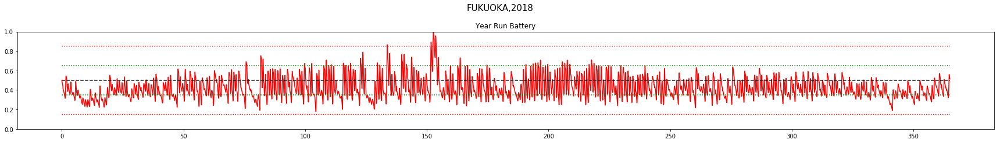



FUKUOKA
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.98		0	 0	0	0
2001	 0.99		0	 0	0	0
2002	 0.97		1	 4	4	0
2003	 0.99		0	 0	0	0
2004	 0.99		0	 0	0	0
2005	 0.99		0	 0	0	0
2006	 0.96		5	 56	56	0
2007	 0.99		0	 0	0	0
2008	 0.97		0	 0	0	0
2009	 0.92		9	 89	83	6
2010	 0.98		0	 0	0	0
2011	 0.9		16	 172	172	0
2012	 0.97		0	 0	0	0
2013	 0.98		0	 0	0	0
2014	 0.98		0	 0	0	0
2015	 0.97		3	 32	32	0
2016	 0.95		5	 78	78	0
2017	 0.99		0	 0	0	0
2018	 0.97		1	 2	0	2

TOTAL Day  Violations:   40.0
TOTAL Batt  Violations:  433.0
TOTAL EMPTY Violations:  425.0
TOTAL FULL  Violations:  8.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


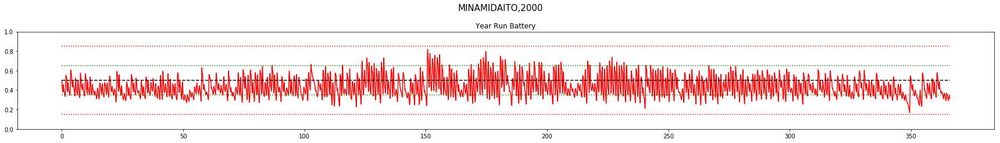



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


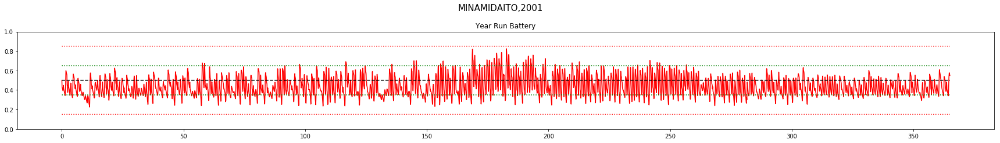



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


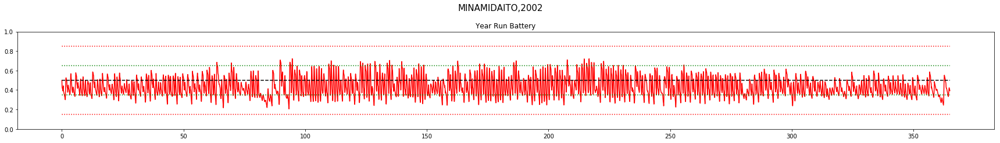



************************************
Day Violations           =      4
Battery Limit Violations =     13
Battery FULL Violations  =     13
Battery EMPTY Violations =      0


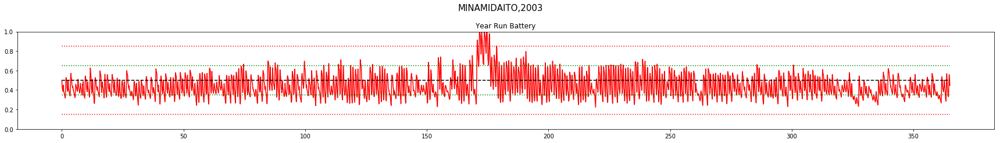



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


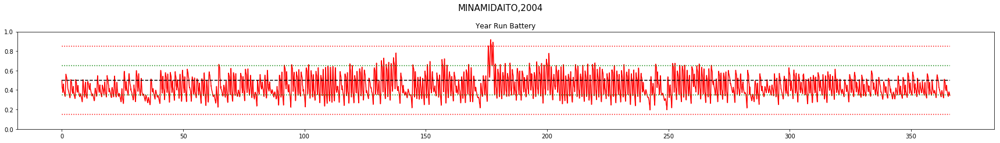



************************************
Day Violations           =      2
Battery Limit Violations =     32
Battery FULL Violations  =      0
Battery EMPTY Violations =     32


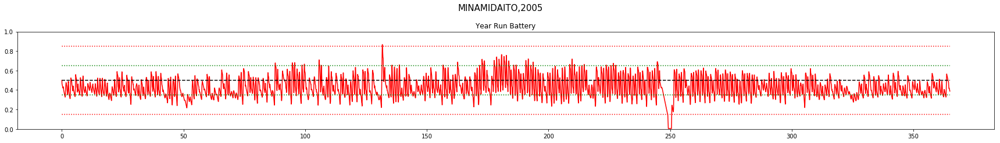



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


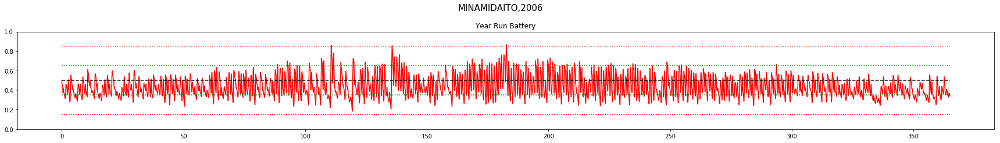



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


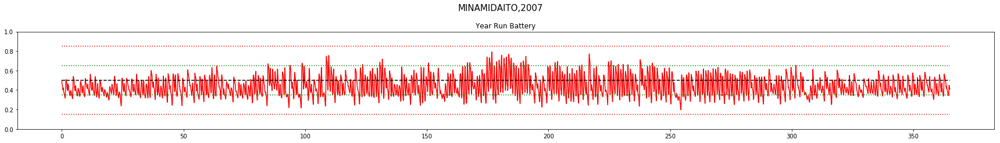



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


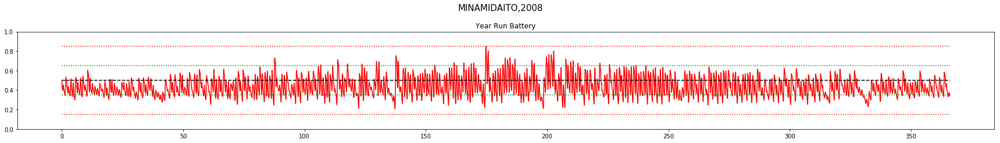



************************************
Day Violations           =      1
Battery Limit Violations =      8
Battery FULL Violations  =      0
Battery EMPTY Violations =      8


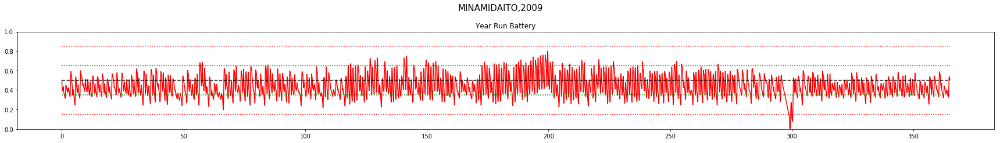



************************************
Day Violations           =      6
Battery Limit Violations =     31
Battery FULL Violations  =     20
Battery EMPTY Violations =     11


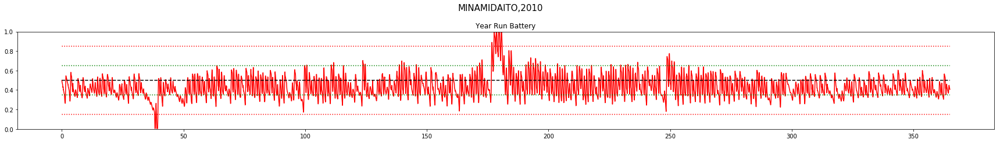



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


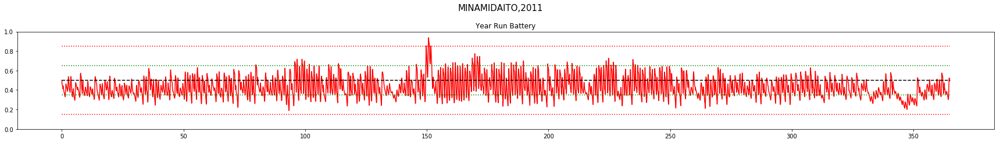



************************************
Day Violations           =      4
Battery Limit Violations =     62
Battery FULL Violations  =      0
Battery EMPTY Violations =     62


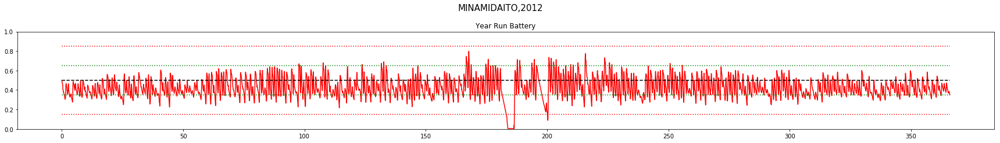



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


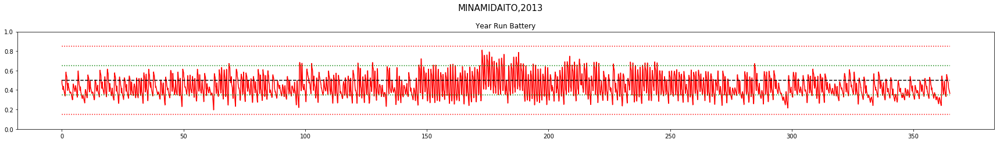



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


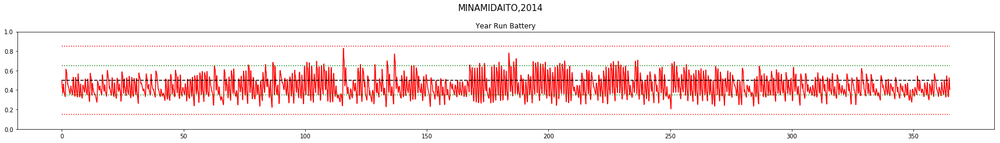



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


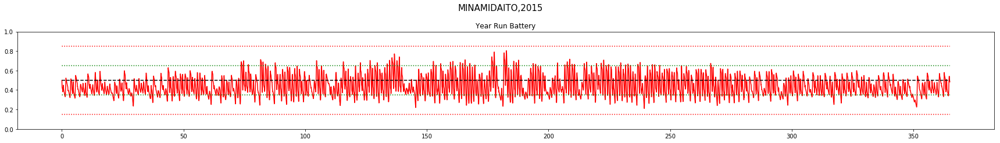



************************************
Day Violations           =      2
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


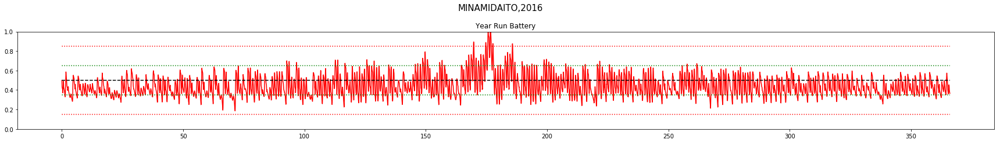



************************************
Day Violations           =      3
Battery Limit Violations =     17
Battery FULL Violations  =     17
Battery EMPTY Violations =      0


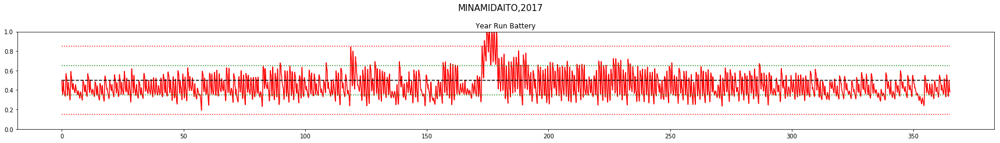



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


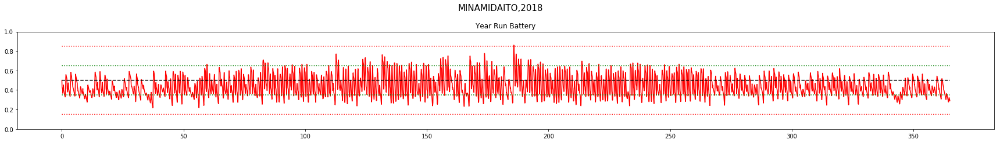



MINAMIDAITO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.0		0	 0	0	0
2001	 1.0		0	 0	0	0
2002	 0.99		0	 0	0	0
2003	 0.98		4	 13	0	13
2004	 0.99		0	 0	0	0
2005	 0.98		2	 32	32	0
2006	 1.0		0	 0	0	0
2007	 1.0		0	 0	0	0
2008	 1.0		0	 0	0	0
2009	 0.99		1	 8	8	0
2010	 0.97		6	 31	11	20
2011	 0.98		0	 0	0	0
2012	 0.97		4	 62	62	0
2013	 1.0		0	 0	0	0
2014	 1.0		0	 0	0	0
2015	 1.0		0	 0	0	0
2016	 0.99		2	 8	0	8
2017	 0.98		3	 17	0	17
2018	 1.0		0	 0	0	0

TOTAL Day  Violations:   22.0
TOTAL Batt  Violations:  171.0
TOTAL EMPTY Violations:  113.0
TOTAL FULL  Violations:  58.0
************************************


In [40]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
for LOCATION in ['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
    results = np.empty(6)
    for YEAR in np.arange(2000,2019):
        capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations), int(capm.batt_empty_counter), int(capm.batt_full_counter)]))
        print("\n\n************************************")
        print("Day Violations           = {:6d}".format(capm.violation_counter))
        print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
        print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
        print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    ###########################################################################################
    ###########################################################################################
        #     Plot the reward and battery for the entire year run
        title = LOCATION.upper() + ',' + str(YEAR)
        NO_OF_DAYS = capm.eno.NO_OF_DAYS

        fig = plt.figure(figsize=(24,6))
        fig.suptitle(title, fontsize=15)

    #         ax1 = fig.add_subplot(211)
    #         ax1.plot(yr_test_reward_rec)
    #         ax1.set_title("\n\nYear Run Reward")
    #         ax1.set_ylim([-4,2])

        ax2 = fig.add_subplot(211)
        ax2.plot(yr_test_record[:,0],'r')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

        ax2.set_title("\n\nYear Run Battery")
        ax2.set_ylim([0,1])
        plt.sca(ax2)
        plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
        fig.tight_layout()
        plt.show()
    ###########################################################################################
    ###########################################################################################


    results = np.delete(results,0,0)
    print("\n")
    print(LOCATION.upper())
    print('YEAR\tAVG_RWD\t\tVIOLATIONS\tEMPTY\tFULL')
    print('\t\t\tDAY\tBATT')

    for x in np.arange(0,results.shape[0]):
        print('{}\t {}\t\t{}\t {}\t{}\t{}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,3]), int(results[x,4]),  int(results[x,5]) ))

    print("\nTOTAL Day  Violations:  ",np.sum(results[:, 2]))
    print("TOTAL Batt  Violations: ",np.sum(results[:,3]))
    print("TOTAL EMPTY Violations: ",np.sum(results[:,4]))
    print("TOTAL FULL  Violations: ",np.sum(results[:,5]))
    print("************************************")